<a href="https://colab.research.google.com/github/Matan231/e2e-DL-CTC-ASR-model-with-audio-augmentations/blob/main/CTC_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#imports and Downloads

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!pip install torchmetrics
from torchmetrics.text import WordErrorRate


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.8/764.8 kB 7.6 MB/s eta 0:00:00


In [ ]:
import gdown
import zipfile
from google.colab import drive
import os
import torchaudio
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchaudio.transforms as T
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import random

In [ ]:
!pip install jiwer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 9.5 MB/s eta 0:00:00


In [ ]:
from jiwer import wer as wer_rate
from jiwer import cer as cer_rate

In [ ]:
print(torch.__version__)

2.0.1+cu118


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install git+https://github.com/facebookresearch/WavAugment

  Cloning https://github.com/facebookresearch/WavAugment to /tmp/pip-req-build-0b97uf37
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/WavAugment /tmp/pip-req-build-0b97uf37
  Resolved https://github.com/facebookresearch/WavAugment to commit 54afcdb00ccc852c2f030f239f8532c9562b550e
  Preparing metadata (setup.py) ... done
  Created wheel for augment: filename=augment-0.2-py3-none-any.whl size=5337 sha256=6d0fb828ae9e2e68bf4ac8297b4a7ddafdbaaf092fbbbf8afcbb0a3ea5a8219d
  Stored in directory: /tmp/pip-ephem-wheel-cache-elm2rtmo/wheels/ec/ba/11/0a26f1460a8feb6b186983fbf9aecfe22ef006cffd20c63b43
Successfully built augment


In [ ]:
!pip install git+https://github.com/Spijkervet/torchaudio-augmentations.git

  Cloning https://github.com/Spijkervet/torchaudio-augmentations.git to /tmp/pip-req-build-owhn49mk
  Running command git clone --filter=blob:none --quiet https://github.com/Spijkervet/torchaudio-augmentations.git /tmp/pip-req-build-owhn49mk
  Resolved https://github.com/Spijkervet/torchaudio-augmentations.git to commit 891b3b6e19551c211e7cdab36376c7e67e9d199c
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for torchaudio-augmentations: filename=torchaudio_augmentations-0.2.4-py3-none-any.whl size=12190 sha256=252b6e9520c69bb9e9bc254c1b730a8d6dc09fe2ec013ddf50b4010bfb948435
  Stored in directory: /tmp/pip-ephem-wheel-cache-5ic4cfkt/wheels/06/27/49/c19e8f38212e0b8bfb7fb043260043e0ab0d9b351c6e2d5b6a
  Created wheel for julius: filename=julius-0.2.7-py3-none-any.whl size=21868 sha256=8a511678b2dac8861d4e04437d2400b6408a5186d14a7e7b2063fa340dc43cf2
  Stored in d

In [ ]:
from torchaudio.models.decoder import download_pretrained_files

librispeech_files = download_pretrained_files("librispeech-4-gram")


/usr/local/lib/python3.10/dist-packages/torchaudio/models/decoder/_ctc_decoder.py:62: UserWarning: The built-in flashlight integration is deprecated, and will be removed in future release. Please install flashlight-text. https://pypi.org/project/flashlight-text/ For the detail of CTC decoder migration, please see https://github.com/pytorch/audio/issues/3088.
  warnings.warn(
100%|██████████| 4.97M/4.97M [00:00<00:00, 37.1MB/s]
100%|██████████| 57.0/57.0 [00:00<00:00, 58.4kB/s]
100%|██████████| 2.91G/2.91G [00:33<00:00, 93.9MB/s]


In [ ]:
seed = 42
torch.manual_seed(seed)

# Utils


In [ ]:
class LetterTokenizer:
    def __init__(self, pad_token="<PAD>", start_token="<START>", end_token="<END>", add_start_stop=True):
        self.char_to_int = {}
        self.int_to_char = {}
        self.pad_token = pad_token
        self.start_token = start_token
        self.end_token = end_token
        self.num_tokens = len(self.int_to_char)
        self.add_start_stop = add_start_stop

    def fit(self, texts):
        unique_chars = "".join(texts).lower()
        self.char_to_int = {char: i for i, char in enumerate(unique_chars)}
        self.int_to_char = {i: char for char, i in self.char_to_int.items()}

        # Add special tokens to the mapping

        self.char_to_int[self.start_token] = len(self.char_to_int)
        self.int_to_char[len(self.int_to_char)] = self.start_token

        self.char_to_int[self.end_token] = len(self.char_to_int)
        self.int_to_char[len(self.int_to_char)] = self.end_token

        self.char_to_int[self.pad_token] = len(self.char_to_int)
        self.int_to_char[len(self.int_to_char)] = self.pad_token

        self.num_tokens = len(self.char_to_int)

    def tokenize(self, text):

        text = text.lower().replace(' ', '|')
        if self.add_start_stop:
          tokens = [self.char_to_int[self.start_token]] + [self.char_to_int[char] for char in text] + [self.char_to_int[self.end_token]]
        else:
          tokens = [self.char_to_int[char] for char in text]

        return tokens

    def detokenize(self, tokens):
      start_idx = tokenizer.char_to_int[tokenizer.start_token]
      end_idx = tokenizer.char_to_int[tokenizer.end_token]

      padding_idx = tokenizer.char_to_int[tokenizer.pad_token]
      if start_idx in tokens:
        tokens.remove(start_idx)

      if end_idx in tokens:
        tokens.remove(end_idx)

      while padding_idx in tokens:
        tokens.remove(padding_idx)

      return ''.join(self.int_to_char[token] for token in tokens)

    def pad_sequences(self, sequences, max_length=None):
        if not max_length:
            max_length = max(len(seq) for seq in sequences)

        return [seq + [self.char_to_int[self.pad_token]] * (max_length - len(seq)) for seq in sequences]




In [ ]:
mel_spectrogram = T.MelSpectrogram(
    sample_rate=16000,
    n_fft=int(0.025*16000),     # Corresponding to 25ms
    win_length=int(0.025*16000), # Corresponding to 25ms
    hop_length=int(0.010*16000), # Corresponding to 10ms
    n_mels=128,
    center=True,
    normalized=True,
    power=2.0,
    pad_mode="reflect",
    f_min=110,
    f_max=8000,
    window_fn=torch.hamming_window
)


/usr/local/lib/python3.10/dist-packages/torchaudio/functional/functional.py:576: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


In [ ]:
mel_spec = mel_spectrogram
def to_mel(waveform, to_log_mel=False):
  # Convert waveform to Mel scale
  mel_output = mel_spec(waveform)
  if to_log_mel:
    mel_output = torch.log(mel_output + 1e-9)

  return mel_output

In [ ]:
from IPython.display import Audio
import time

def play_audio(wav_file, sample_rate = 44100, autoplay=False):
  if not isinstance(wav_file, torch.Tensor):
    waveform, sample_rate = torchaudio.load(wav_file)
  else:
    waveform = wav_file
  # Convert the PyTorch tensor to a NumPy array
  audio_np = waveform.numpy()
  # Display and play the audio
  ad = Audio(data=audio_np, rate=sample_rate, autoplay=autoplay)
  display(ad)

In [ ]:
# Plotting
def plot_wav(waveform, log_mel_output):
  sample_rate = 16000
  fig, ax = plt.subplots(2, 1, figsize=(8, 6))

  # Plot waveform
  ax[0].plot(np.linspace(0, waveform.shape[1] / sample_rate, waveform.shape[1]), waveform.squeeze().numpy())
  ax[0].set_title("Waveform")
  ax[0].set_xlabel("Time (s)")
  ax[0].set_ylabel("Amplitude")

  # Plot log Mel spectrogram
  img = ax[1].imshow(log_mel_output.squeeze().numpy(), cmap='inferno', origin='lower', aspect='auto')
  ax[1].set_title("Log Mel Spectrogram")
  ax[1].set_xlabel("Time (s)")
  ax[1].set_ylabel("Mel Scale")
  fig.colorbar(img, ax=ax[1])

  plt.tight_layout()
  plt.show()

In [ ]:
def wer_valedation(data_loader, model, num_batchs = 2, verbus=False, ext_decoder=None, transform_fft=None, full_epoch=False, to_log_mel=False):
  model.eval()
  pred_texts = []
  target_texts = []
  with torch.no_grad():
    for i, batch in enumerate(data_loader):
        waveforms, captions, sample_rate = batch
        waveforms = waveforms.to(device)



        for i,_ in enumerate(waveforms):
          wave = waveforms[i].view(1,1,-1)
          wave = to_mel(wave, to_log_mel)
          if transform_fft != None:
            wave = transform_fft(wave)
          if ext_decoder:
            gen_text = model.generate_text(wave, ext_decoder=ext_decoder)
          else:
            gen_text = model.generate_text(wave)

          pred_texts.append(gen_text.replace('|', ' '))
          target_texts.append(tokenizer.detokenize(captions[i]).replace('|', ' '))

        if (not full_epoch) and i >= num_batchs:
          break
    wer_value = wer_rate(target_texts, pred_texts)
    cer_value = cer_rate(target_texts, pred_texts)
    if verbus:
      for i,_ in enumerate(target_texts):
        print(f"{target_texts[i]}, {pred_texts[i]}")

  return wer_value, cer_value

In [ ]:
def plot_train_val(train, val, measure="Loss"):
  plt.plot(train, label=f'Train {measure}')
  plt.plot(val, label=f'Val {measure}')
  plt.xlabel('Epochs')
  plt.ylabel(f'{measure}')
  plt.legend()
  plt.show()

# Dataset

In [ ]:
class MyPipeline(torch.nn.Module):
    def __init__(
        self,
        sample_rate=16000,
        n_fft=int(0.025*16000),     # Corresponding to 25ms
        n_mel=128,
        stretch_factor=0.8,
    ):
        super().__init__()
        #self.resample = T.Resample(orig_freq=input_freq, new_freq=resample_freq)

        self.spec = T.Spectrogram(n_fft=n_fft, power=2)

        self.spec_aug = torch.nn.Sequential(
            T.TimeStretch(stretch_factor, fixed_rate=True),
            T.FrequencyMasking(freq_mask_param=40),
            T.TimeMasking(time_mask_param=60),
        )

        self.mel_scale = T.MelScale(
            n_mels=n_mel, sample_rate=sample_rate, n_stft=n_fft // 2 + 1)

    def forward(self, waveform: torch.Tensor) -> torch.Tensor:
        # Convert to power spectrogram
        spec = self.spec(waveform)

        # Apply SpecAugment
        spec = self.spec_aug(spec)

        # Convert to mel-scale
        mel = self.mel_scale(spec)

        return mel

In [ ]:
# Instantiate a pipeline
pipeline = MyPipeline()


/usr/local/lib/python3.10/dist-packages/torchaudio/functional/functional.py:576: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (201) may be set too low.
  warnings.warn(


In [ ]:
drive_file_id = "1MiPqJDm6gX_ayXZJ2LHeUbG0UNZfNagF"
drive_link = f"https://drive.google.com/uc?export=download&id={drive_file_id}"

# Replace DESTINATION_PATH with the path where you want to save the file
destination_path = "/content/An4_dataset.zip"

gdown.download(drive_link, destination_path, quiet=False)



# Extract the zip file
with zipfile.ZipFile(destination_path, 'r') as zip_ref:
    zip_ref.extractall('/content/extracted_contents')


Downloading...
From: https://drive.google.com/uc?export=download&id=1MiPqJDm6gX_ayXZJ2LHeUbG0UNZfNagF
To: /content/An4_dataset.zip
100%|██████████| 64.6M/64.6M [00:00<00:00, 149MB/s]


In [ ]:
def files_to_list(folder_name, file_type):
  files_paths = []
  for filename in os.listdir(folder_name):
    if filename.endswith(f".{file_type}"):
      path = os.path.join(folder_name, filename)
      files_paths.append(path)

  return files_paths


def dataset_creator():
  dataset_folder = "/content/extracted_contents/an4"
  train_val_test = ["train", 'val', 'test']
  dataset = {}
  for folder in train_val_test:
    wav_folder_path = f"{dataset_folder}/{folder}/an4/wav"
    txt_folder_path = f"{dataset_folder}/{folder}/an4/txt"
    wav_files = sorted(files_to_list(wav_folder_path, file_type="wav"))
    txt_files = sorted(files_to_list(txt_folder_path, file_type="txt"))

    dataset[folder] = zip(wav_files, files_to_text(txt_files))

  return dataset

In [ ]:
# define the tokenizer
tokenizer = LetterTokenizer(add_start_stop=False)

with open(librispeech_files.tokens, 'r') as file:
    content = file.read()

tokens = content.replace('\n',"")
print(tokens)
tokenizer.fit(tokens)


tokens = [tokenizer.tokenize(text) for text in [tokens]]
print("Tokens:", tokens)

padded_tokens = tokenizer.pad_sequences(tokens)
print("Padded Tokens:", padded_tokens)

for pt in padded_tokens:
    print(tokenizer.detokenize(pt))  # This will show start, end, and padding tokens

-|etaonihsrdlumwcfgypbvk'xjqz
Tokens: [[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]]
Padded Tokens: [[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]]
-|etaonihsrdlumwcfgypbvk'xjqz


In [ ]:
# define data augmentations

from torchaudio_augmentations import *

sr=int(16000)
num_samples = 103000

transforms = [
    RandomResizedCrop(n_samples=num_samples),
    RandomApply([PolarityInversion()], p=0.8),
    RandomApply([Noise(min_snr=0.001, max_snr=0.005)], p=0.3),
    RandomApply([Gain()], p=0.2),
    HighLowPass(sample_rate=sr), # this augmentation will always be applied in this aumgentation chain!
    # RandomApply([Delay(sample_rate=sr)], p=0.1),
    RandomApply([PitchShift(
        n_samples=num_samples,
        sample_rate=sr
    )], p=0.4),
    # RandomApply([Reverb(sample_rate=sr)], p=0.3)
]
transform_wav = Compose(transforms=transforms)

In [ ]:
speed_perturb = torchaudio.transforms.SpeedPerturbation(16000, [0.9, 1.1, 0.95, 1.0, 1.0])


In [ ]:
def tranform_final(wav):
  wav = transform_wav(wav)
  wav = speed_perturb(wav)[0]
  return wav

In [ ]:
class SpeechToTextDataset(Dataset):
    def __init__(self, audio_root, text_root, transform=None, total_max_length=120000):
        self.audio_root = audio_root
        self.text_root = text_root
        self.audio_files = self._collect_audio_files()
        self.transform = transform
        self.total_max_length = total_max_length

    def __len__(self):
        return len(self.audio_files)

    def __getitem__(self, idx):
        audio_file, text_file = self.audio_files[idx]
        waveform, sample_rate = torchaudio.load(audio_file)

        with open(text_file, 'r') as text_file:
            transcript = text_file.read().strip()

        if self.transform:
          waveform = torch.nn.functional.pad(waveform, (0, 103000 - waveform.shape[1]))
          waveform = self.transform(waveform)


        return waveform, transcript ,sample_rate

    def _collect_audio_files(self):
        audio_files = []
        for audio_filename in os.listdir(self.audio_root):
            if audio_filename.endswith(".wav"):
                base_name = os.path.splitext(audio_filename)[0]
                audio_path = os.path.join(self.audio_root, audio_filename)
                text_path = os.path.join(self.text_root, f"{base_name}.txt")
                if os.path.exists(text_path):
                    audio_files.append((audio_path, text_path))
        return audio_files

    def collate_fn(self, batch):
        waveforms, transcripts, sample_rate = zip(*batch)
        tokens = [tokenizer.tokenize(text) for text in transcripts]

        padded_tokens = tokenizer.pad_sequences(tokens)
        # Pad audio tensors to the same length
        max_length = max(w.shape[1] for w in waveforms)
        if self.total_max_length != None:
          max_length = max(self.total_max_length, max_length)
        padded_waveforms = [torch.nn.functional.pad(w, (0, max_length - w.shape[1])) for w in waveforms]
        padded_waveforms = torch.stack(padded_waveforms)


        return padded_waveforms, padded_tokens, sample_rate


In [ ]:


def create_data_loaders(batch_size=64, transform=None):
  dataset_folder = "/content/extracted_contents/an4"
  num_workers = 2

  # train dataset
  audio_root = f"{dataset_folder}/{'train'}/an4/wav"
  text_root = f"{dataset_folder}/{'train'}/an4/txt"
  train_dataset = SpeechToTextDataset(audio_root=audio_root, text_root=text_root, transform=transform)
  # val dataset
  audio_root = f"{dataset_folder}/{'val'}/an4/wav"
  text_root = f"{dataset_folder}/{'val'}/an4/txt"
  val_dataset = SpeechToTextDataset(audio_root=audio_root, text_root=text_root, transform=None)
  # test dataset
  audio_root = f"{dataset_folder}/{'test'}/an4/wav"
  text_root = f"{dataset_folder}/{'test'}/an4/txt"
  test_dataset = SpeechToTextDataset(audio_root=audio_root, text_root=text_root, transform=None)
  train_data_loader = DataLoader(train_dataset, batch_size=batch_size, collate_fn=train_dataset.collate_fn, shuffle=True, num_workers=num_workers)
  val_data_loader = DataLoader(val_dataset, batch_size=batch_size, collate_fn=val_dataset.collate_fn, shuffle=True, num_workers=num_workers)
  test_data_loader = DataLoader(test_dataset, batch_size=batch_size, collate_fn=test_dataset.collate_fn, shuffle=True, num_workers=num_workers)

  return train_data_loader, val_data_loader, test_data_loader


In [ ]:
# creating dataloaders
batch_size = 64
transform = tranform_final  # Add your audio transformations

train_data_loader, val_data_loader, test_data_loader = create_data_loaders(batch_size=batch_size, transform=transform)


In [ ]:
transform_fft = nn.Sequential(
    torchaudio.transforms.FrequencyMasking(freq_mask_param=25),
    torchaudio.transforms.TimeMasking(time_mask_param=30)
)

In [ ]:
stretch_factor = 2.0
spec_aug = torch.nn.Sequential(
        torchaudio.transforms.TimeStretch(stretch_factor, fixed_rate=True),
        torchaudio.transforms.FrequencyMasking(freq_mask_param=15),
        torchaudio.transforms.TimeMasking(time_mask_param=35),
        )

In [ ]:
# checking the data
def plot_data(data_loader):
  for batch in data_loader:
      waveforms, transcripts, sample_rate = batch

      mel_waveforms = to_mel(waveforms)
      mel_waveforms = log_mel_output = torch.log(mel_waveforms + 1e-9)
      mel_waveforms = transform_fft(mel_waveforms)
      #mel_waveforms= pipeline(waveforms)
      print(waveforms.size())

      for i, wav in enumerate(waveforms):
        #wav = transform_wav(wav)
        print(tokenizer.detokenize(transcripts[i]))

        print(f'Log_mel size:{mel_waveforms.size()}')
        print(f'transform size:{mel_waveforms.size()}')
        plot_wav(wav, mel_waveforms[i])

        play_audio(wav, sample_rate[0])
        if i > 8:
          break

      break

torch.Size([64, 1, 120000])
b|v|i|q|g|eighty|six
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


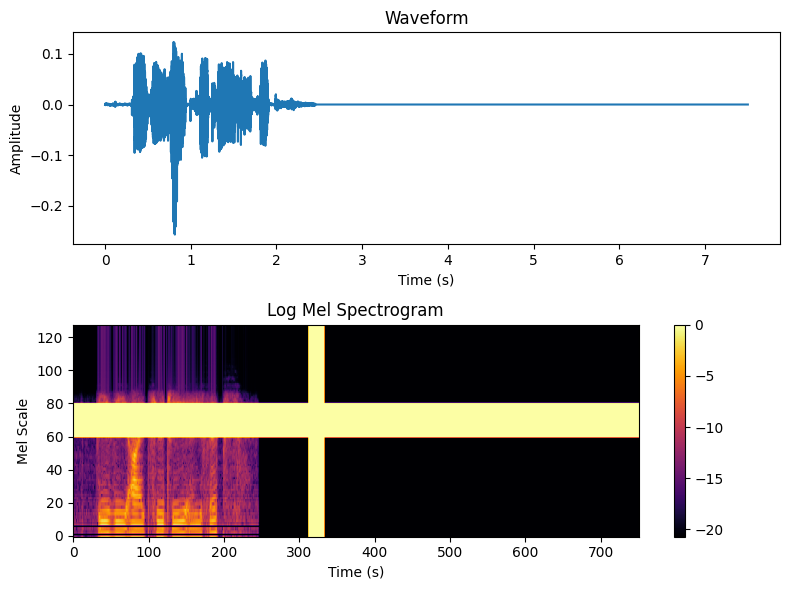

two|two|nine|three
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


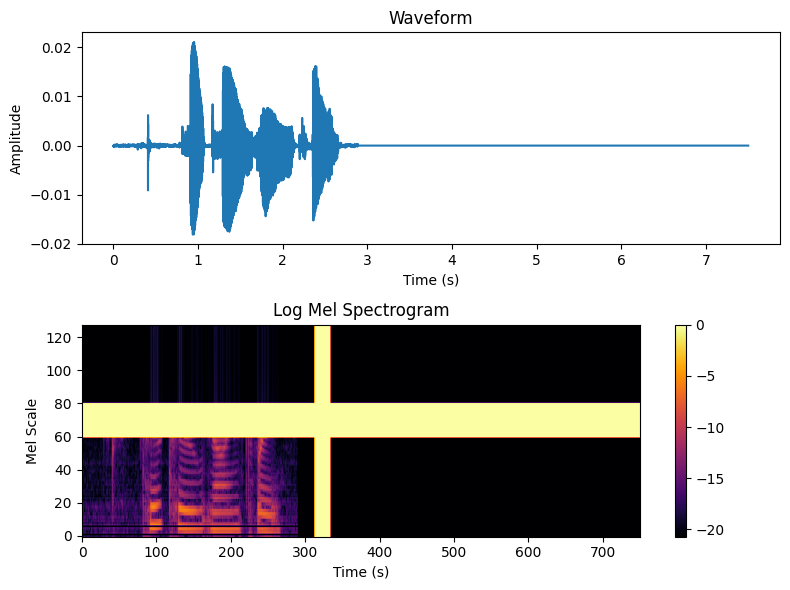

f|e|g|b|forty|eight
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


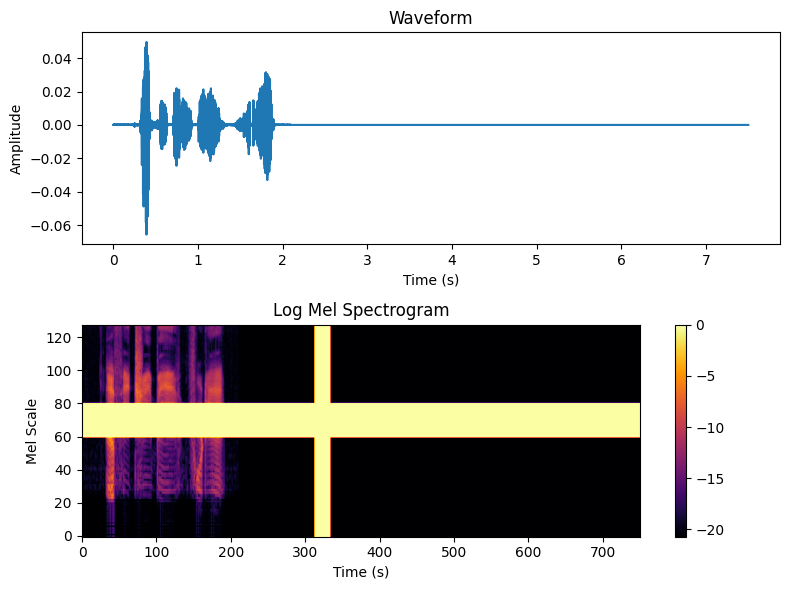

r|g|c|s|seven|sixty|seven
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


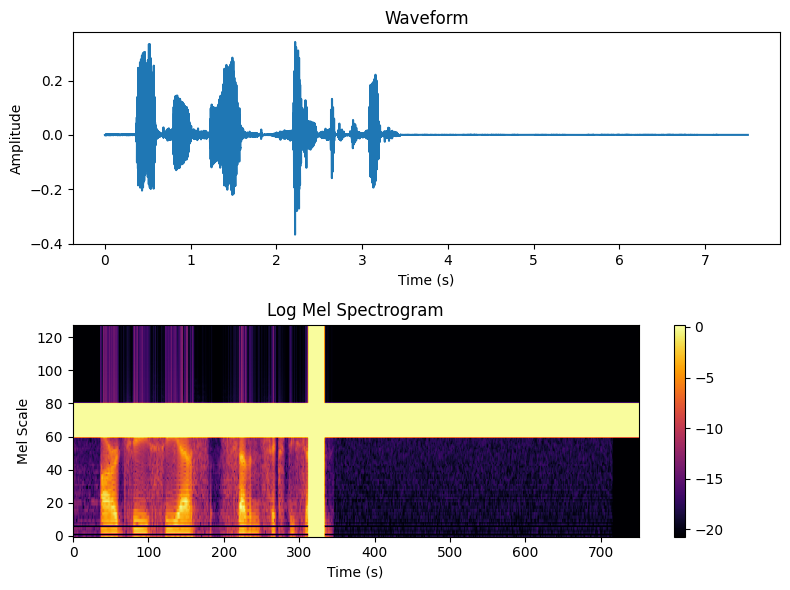

l|r|r|k|i|four
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


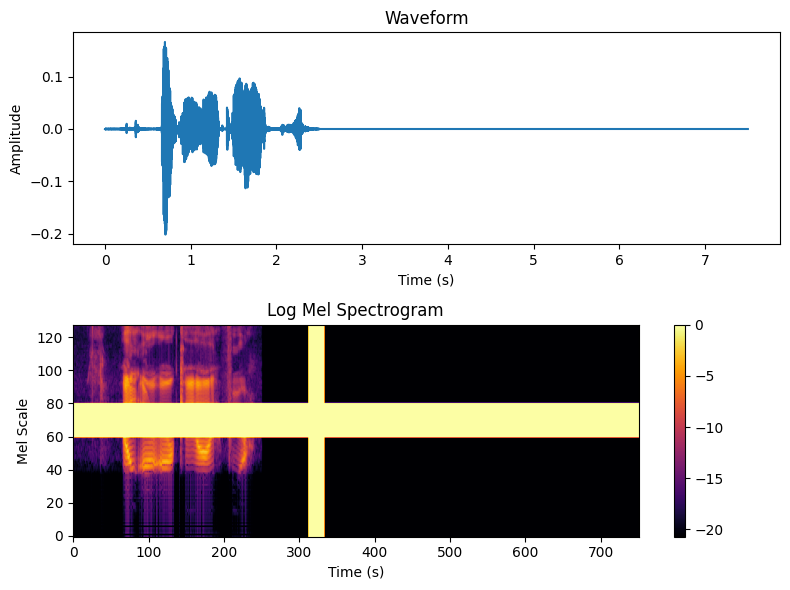

n|e|i|l
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


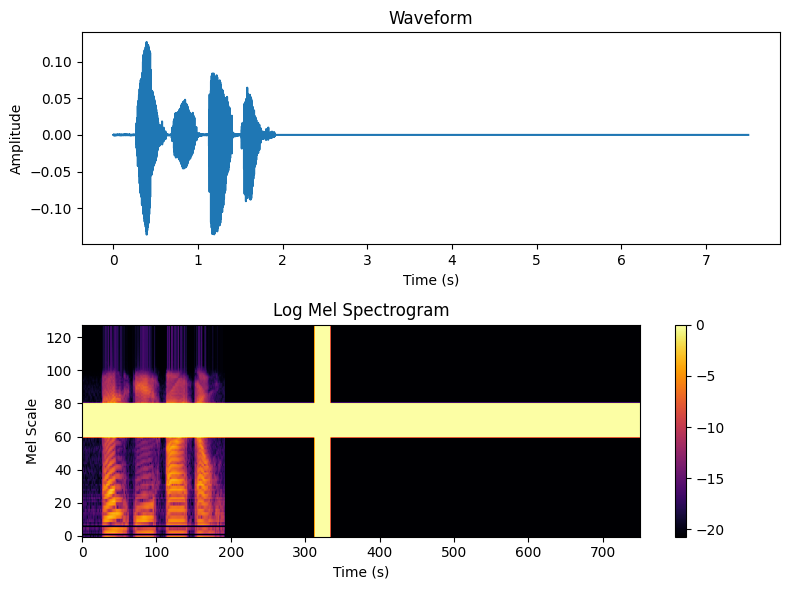

ten|seventy|one
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


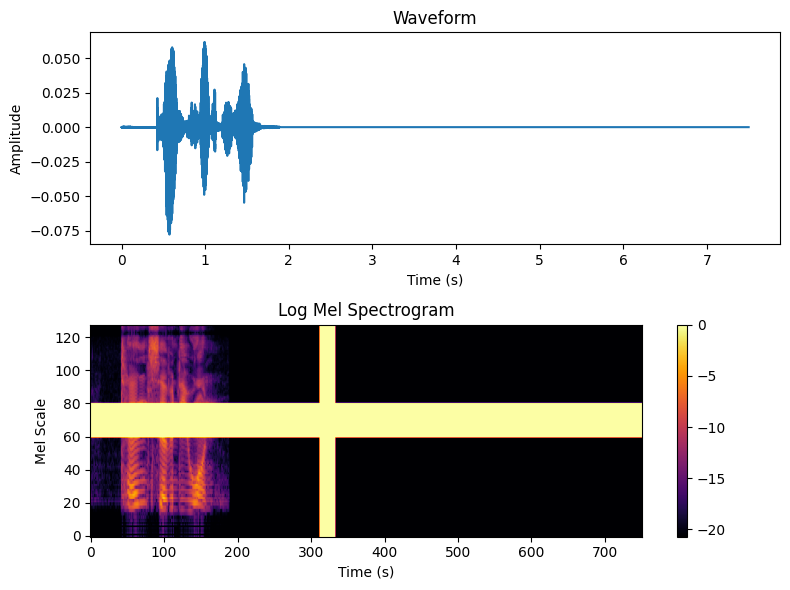

rubout|m|d|m|t|g|nine|six|seven|oh
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


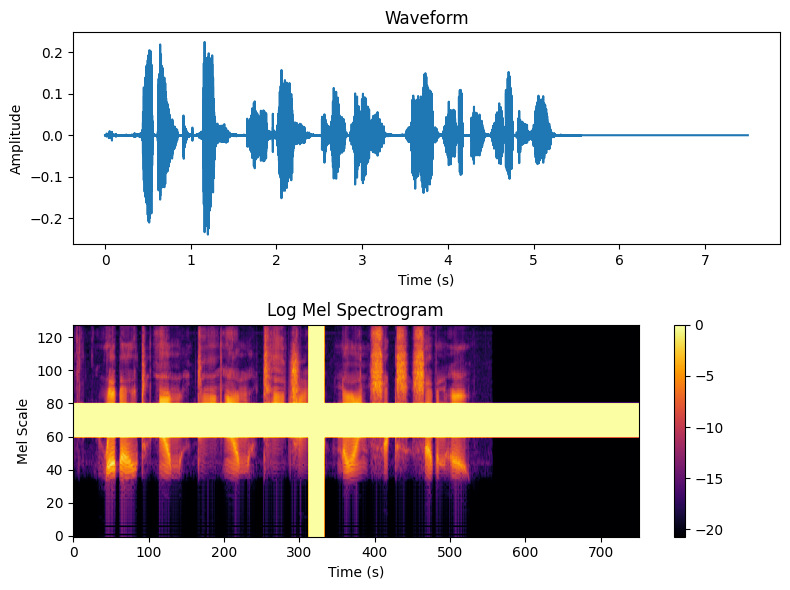

b|r|e|n|n|a|n
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


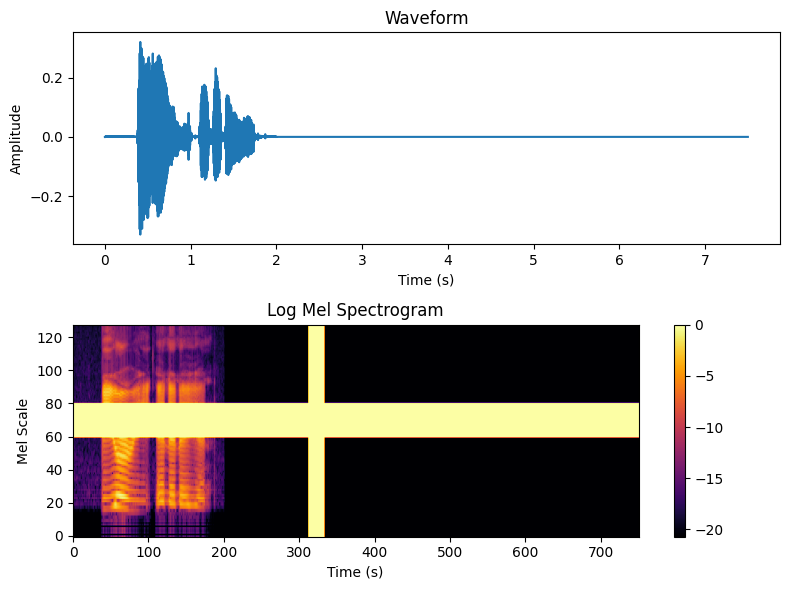

enter|sixty
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


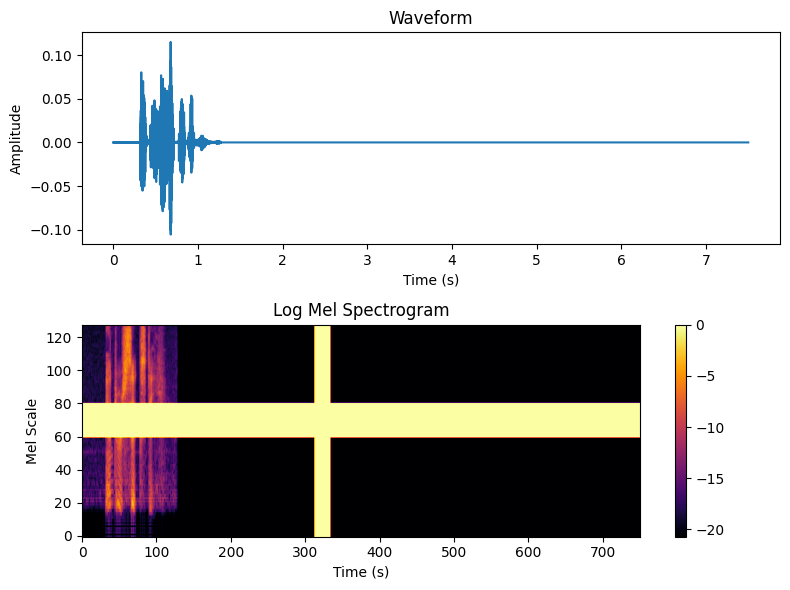

In [ ]:
plot_data(train_data_loader)

# Models

# ctc


## define model and training

In [ ]:
class CNNLayerNorm(nn.Module):
    """Layer normalization built for cnns input"""
    def __init__(self, n_feats):
        super(CNNLayerNorm, self).__init__()
        self.layer_norm = nn.LayerNorm(n_feats)

    def forward(self, x):
        # x (batch, channel, feature, time)

        x = x.transpose(2, 3).contiguous() # (batch, channel, time, feature)
        x = self.layer_norm(x)
        return x.transpose(2, 3).contiguous() # (batch, channel, feature, time)

class ResidualCNN(nn.Module):

    def __init__(self, in_channels, out_channels, kernel, stride, dropout, n_feats):
        super(ResidualCNN, self).__init__()

        self.cnn1 = nn.Conv2d(in_channels, out_channels, kernel, stride, padding=kernel//2)
        self.cnn2 = nn.Conv2d(out_channels, out_channels, kernel, stride, padding=kernel//2)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.layer_norm1 = CNNLayerNorm(n_feats)
        self.layer_norm2 = CNNLayerNorm(n_feats)

    def forward(self, x):
        residual = x  # (batch, channel, feature, time)
        x = self.layer_norm1(x)
        x = F.gelu(x)
        x = self.dropout1(x)
        x = self.cnn1(x)
        x = self.layer_norm2(x)
        x = F.gelu(x)
        x = self.dropout2(x)
        x = self.cnn2(x)
        x += residual
        return x # (batch, channel, feature, time)

In [ ]:
class BidirectionalGRU(nn.Module):

    def __init__(self, rnn_dim, hidden_size, dropout, batch_first):
        super(BidirectionalGRU, self).__init__()

        self.BiGRU = nn.GRU(
            input_size=rnn_dim, hidden_size=hidden_size,
            num_layers=1, batch_first=batch_first, bidirectional=True)
        self.layer_norm = nn.LayerNorm(rnn_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        x = self.layer_norm(x)
        x = F.gelu(x)
        x, _ = self.BiGRU(x)
        x = self.dropout(x)
        return x


In [ ]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor):
        """Given a sequence emission over labels, get the best path
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          List[str]: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)


        indices = [i for i in indices if i != self.blank]
        joined = "".join([self.labels[i.item()] for i in indices])

        #return joined.replace("|", " ").strip().split()
        return joined


In [ ]:
class SpeechRecognitionModel(nn.Module):
    """Speech Recognition Model Inspired by DeepSpeech 2"""

    def __init__(self, n_cnn_layers, n_rnn_layers, rnn_dim, n_class, n_feats, stride=2, dropout=0.1, ctc_decoder=None):
        super(SpeechRecognitionModel, self).__init__()
        n_feats_fft = n_feats
        n_feats = n_feats//stride

        # self.cnn = nn.Conv2d(1, 32, 7, stride=stride, padding=7//2)

        self.cnn = nn.Sequential(
          nn.Conv2d(1, 16, 7, stride=1, padding=3),
          ResidualCNN(16, 16, kernel=3, stride=1, dropout=dropout, n_feats=n_feats_fft),
          CNNLayerNorm(n_feats_fft),
          nn.GELU(),
          nn.Dropout(dropout),
          nn.Conv2d(16, 32, 3, stride=stride, padding=3//2)
        )

        # n residual cnn layers with filter size of 32
        self.rescnn_layers = nn.Sequential(*[
            ResidualCNN(32, 32, kernel=3, stride=1, dropout=dropout, n_feats=n_feats)
            for _ in range(n_cnn_layers)
        ])
        self.fully_connected = nn.Linear(n_feats*32, rnn_dim)
        self.birnn_layers = nn.Sequential(*[
            BidirectionalGRU(rnn_dim=rnn_dim if i==0 else rnn_dim*2,
                             hidden_size=rnn_dim, dropout=dropout, batch_first=i==0)
            for i in range(n_rnn_layers)
        ])
        self.classifier = nn.Sequential(
            nn.Linear(rnn_dim*2, rnn_dim),  # birnn returns rnn_dim*2
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(rnn_dim, n_class)
        )


        if ctc_decoder == None:
          self.ctc_decoder = GreedyCTCDecoder(tokenizer.int_to_char)
        else:
          self.ctc_decoder = ctc_decoder


    def forward(self, x):
        x = self.cnn(x)
        x = self.rescnn_layers(x)
        sizes = x.size()
        x = x.view(sizes[0], sizes[1] * sizes[2], sizes[3])  # (batch, feature, time)
        x = x.transpose(1, 2) # (batch, time, feature)
        x = self.fully_connected(x)
        x = self.birnn_layers(x)
        x = self.classifier(x)
        return x

    def generate_text(self, x, ext_decoder=None):
      output = self.forward(x) # (batch, time, n_class)
      if ext_decoder != None:
        text = ext_decoder(output[0])
      else:
        text = self.ctc_decoder(output[0])

      return text


In [ ]:
def testing_ctc_loss(data_loader, model=None):
  # Testing
  model.eval()
  test_loss = 0.0
  with torch.no_grad():
      for i, batch in enumerate(data_loader):  # Assume test_loader is your DataLoader for test data
        waveforms, captions, sample_rate = batch
        waveforms = to_mel(waveforms.to(device))
        batch_size = waveforms.size()[0]
        indexes = [caption.index(31) if 31 in caption else len(caption) for caption in captions]
        captions = torch.tensor(captions).to(device)


        output = model(waveforms)  # (batch, time, n_class)
        seq_size = output.size()[1]
        output = F.log_softmax(output, dim=2)
        output = output.transpose(0, 1) # (time, batch, n_class)
        captions_length = captions.size()[1]
        input_lengths = torch.full(size=(batch_size,), fill_value=seq_size, dtype=torch.long)
        label_lengths = torch.tensor(indexes, dtype=torch.long)

        loss = criterion(output, captions, input_lengths, label_lengths)
        test_loss += loss.item() * batch_size
      test_loss /= len(data_loader.dataset)

  return test_loss


In [ ]:
def train_model(model, num_epochs, criterion, optimizer, scheduler, transform_fft=None, train_data_loader=train_data_loader, val_data_loader=val_data_loader):
  train_loss_history = []
  train_wer_history = []
  train_cer_history = []
  val_loss_history = []
  val_wer_history = []
  val_cer_history = []
  mel_spec.to(device)

  for epoch in range(1, num_epochs+1):
      model.train()
      running_loss = 0.0

      for i, batch in enumerate(train_data_loader):
          waveforms, captions, sample_rate = batch
          waveforms = to_mel(waveforms.to(device))
          if transform_fft is not None:
            waveforms = transform_fft(waveforms)
          # waveforms = log_mel_output = torch.log(waveforms + 1e-9)

          batch_size = waveforms.size()[0]
          indexes = [caption.index(31) if 31 in caption else len(caption) for caption in captions]

          captions = torch.tensor(captions).to(device)
          optimizer.zero_grad()
          output = model(waveforms)  # (batch, time, n_class)
          seq_size = output.size()[1]
          output = F.log_softmax(output, dim=2)
          output = output.transpose(0, 1) # (time, batch, n_class)
          captions_length = captions.size()[1]
          input_lengths = torch.full(size=(batch_size,), fill_value=seq_size, dtype=torch.long)
          label_lengths = torch.tensor(indexes, dtype=torch.long)

          loss = criterion(output, captions, input_lengths, label_lengths)
          # Loss calc
          #backward + optimitzer step + zero grads
          loss.backward()
          optimizer.step()

          running_loss += loss.item()*batch_size

      if epoch % 1 == 0:
        scheduler.step()
        train_wer, train_cer = wer_valedation(train_data_loader, model=model, verbus=True, transform_fft=transform_fft)
        val_wer, val_cer = wer_valedation(val_data_loader, model=model)
        val_loss = testing_ctc_loss(val_data_loader, model)
        train_loss = running_loss / len(train_data_loader.dataset)
        print('Epoch: {} | lr: {} | Train Loss: {:.4f}  |  Val Loss: {:.4f}  |  Train Wer: {:.4f} |  Val Wer: {:.4f} '.format(epoch, scheduler.get_last_lr(), train_loss, val_loss, train_wer, val_wer))
        train_loss_history.append(train_loss)
        train_wer_history.append(train_wer)
        train_cer_history.append(train_cer)
        val_loss_history.append(val_loss)
        val_wer_history.append(val_wer)
        val_cer_history.append(val_cer)

  return (train_loss_history, train_wer_history, train_cer_history), (val_loss_history, val_wer_history, val_cer_history)


## Experamints

In [ ]:
# creating dataloaders
batch_size = 64
train_data_transform = None  # Add your audio transformations

train_data_loader, val_data_loader, test_data_loader = create_data_loaders(batch_size=batch_size, transform=train_data_transform)

In [ ]:
hparams = {
    "n_cnn_layers": 4,
    "n_rnn_layers": 3,
    "rnn_dim": 512,
    "n_class": tokenizer.num_tokens - 3,
    "n_feats": 128,
    "stride": 2,
    "dropout": 0.1,
    "learning_rate": 0.0005,
    "batch_size": 64,
    "epochs": 250
}


In [ ]:
model = SpeechRecognitionModel(
    hparams['n_cnn_layers'], hparams['n_rnn_layers'], hparams['rnn_dim'],
    hparams['n_class'], hparams['n_feats'], hparams['stride'], hparams['dropout']
    ).to(device)
lr = hparams['learning_rate']
optimizer = torch.optim.AdamW(model.parameters(), lr)
scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.1, total_iters=hparams['epochs'])
criterion = nn.CTCLoss(blank=0).to(device)

In [ ]:
load_model = False
if load_model:
  name = 'model_weights.pt'
  path = '/content/drive/MyDrive/audio_speech_model_weights' +'/' + name
  model.load_state_dict(torch.load(path))

In [ ]:
fft_tranformation = transform_fft
train_stats, val_stats = train_model(model=model,num_epochs=hparams['epochs'],criterion=criterion, optimizer=optimizer, scheduler=scheduler,transform_fft=fft_tranformation)

z c b e g seventy nine, 
j e n n i f e r, 
w a r d, 
one five three two, 
three twelve fifty eight, 
four two two two oh eight nine, 
twelve nine of sixty, 
enter seven, 
v e c c h i, 
fourteen fourteen, 
two fifteen sixty two, 
enter sixty, 
repeat, 
v f o f h nine four, 
repeat, 
four two two oh eight one six, 
one thirty one sixty three, 
rubout o g d e four seven five seven, 
one five two one three, 
rubout j b x r z nine twenty, 
g r e e n, 
j u l i e, 
g a r l a n d, 
enter fifteen, 
j a m e s, 
one five two one three, 
no, 
a m y, 
erase y b e j q five oh seven, 
c e n t r e a v e n u e, 
rubout c t l e seventy six twelve, 
stop, 
g o t t i e r, 
no, 
one five two three two, 
q c j k eight five eight, 
enter zero, 
p i t t s b u r g h, 
o u four seven twenty nine, 
p i t t s b u r g h, 
five six one five, 
k u n t z, 
repeat, 
p i t t s b u r g h, 
stop, 
k e a n e, 
f e b one eight one nine six four, 
r g c s seven sixty seven, 
j o s e p h, 
one five two oh six, 
six six five 

KeyboardInterrupt: ignored

In [ ]:
def ctc_experamint(hparams=hparams, transform_fft=None, train_data_transform=None, load_model_path=None):
  # data
  mel_spec.to('cpu')
  fft_tranformation = transform_fft
  train_data_transform = train_data_transform
  train_data_loader, val_data_loader, test_data_loader = create_data_loaders(batch_size=batch_size, transform=train_data_transform)
  plot_data(train_data_loader)
  # model

  model = SpeechRecognitionModel(
      hparams['n_cnn_layers'], hparams['n_rnn_layers'], hparams['rnn_dim'],
      hparams['n_class'], hparams['n_feats'], hparams['stride'], hparams['dropout']
      ).to(device)
  if load_model != None:
      model.load_state_dict(torch.load(path))

  lr = hparams['learning_rate']
  optimizer = torch.optim.AdamW(model.parameters(), lr)
  scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.1, total_iters=hparams['epochs'])
  criterion = nn.CTCLoss(blank=0).to(device)
  # training
  train_stats, val_stats = train_model(model=model,
                                       num_epochs=hparams['epochs'],
                                       criterion=criterion,
                                       optimizer=optimizer,
                                       scheduler=scheduler,
                                       transform_fft=fft_tranformation,
                                       train_data_loader=train_data_loader,
                                       val_data_loader=val_data_loader)

  # evaluation:
  train_loss_history, train_wer_history, train_cer_history = train_stats
  val_loss_history, val_wer_history, val_cer_history = val_stats
  plot_train_val(train_loss_history, val_loss_history)
  plot_train_val(train_wer_history, val_wer_history, "Wer")
  plot_train_val(train_cer_history, val_cer_history, "Cer")
  verbus=True
  for i, data_loader in enumerate([test_data_loader, val_data_loader, train_data_loader]):
    if i > 0:
      verbus=False
    wer, cer = wer_valedation(data_loader, model=model, verbus=verbus, ext_decoder= None, full_epoch=True)
    print(f'WER: {wer}')
    print(f'CER: {cer}')

  return model

In [ ]:
#exp3
freq_mask_param = 25
time_mask_param = 30
train_data_transform = None
transform_fft = nn.Sequential(
    torchaudio.transforms.FrequencyMasking(freq_mask_param=freq_mask_param),
    torchaudio.transforms.TimeMasking(time_mask_param=time_mask_param)
)
model = ctc_experamint(hparams=hparams, transform_fft=transform_fft, train_data_transform=train_data_transform)

In [ ]:
#exp4
freq_mask_param = 35
time_mask_param = 35
train_data_transform = None
fft = nn.Sequential(
    torchaudio.transforms.FrequencyMasking(freq_mask_param=freq_mask_param),
    torchaudio.transforms.TimeMasking(time_mask_param=time_mask_param)
)
model = ctc_experamint(hparams=hparams, transform_fft=fft, train_data_transform=train_data_transform)

In [ ]:
#exp5
train_data_transform = tranform_final
fft = None
model = ctc_experamint(hparams=hparams, transform_fft=fft, train_data_transform=train_data_transform)

In [ ]:
hparams = {
    "n_cnn_layers": 4,
    "n_rnn_layers": 3,
    "rnn_dim": 512,
    "n_class": tokenizer.num_tokens - 3,
    "n_feats": 128,
    "stride": 2,
    "dropout": 0.1,
    "learning_rate": 0.0001,
    "batch_size": 64,
    "epochs": 65
}

In [ ]:
load_model = True

model = SpeechRecognitionModel(
    hparams['n_cnn_layers'], hparams['n_rnn_layers'], hparams['rnn_dim'],
    hparams['n_class'], hparams['n_feats'], hparams['stride'], hparams['dropout']
    ).to(device)

if load_model:
  name = 'model_weights.pt'
  path = '/content/drive/MyDrive/audio_speech_model_weights' +'/' + name
  model.load_state_dict(torch.load(path))

torch.Size([64, 1, 120000])
one|five|two|one|eight
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


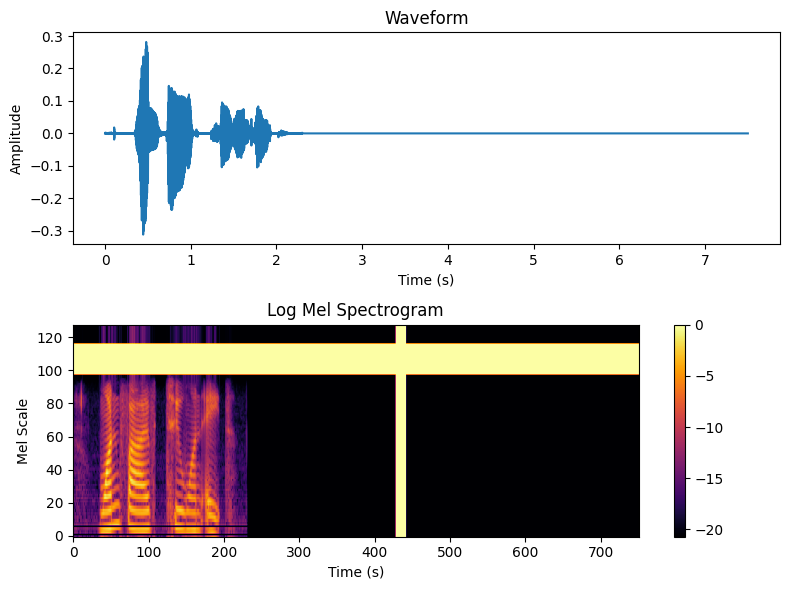

no
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


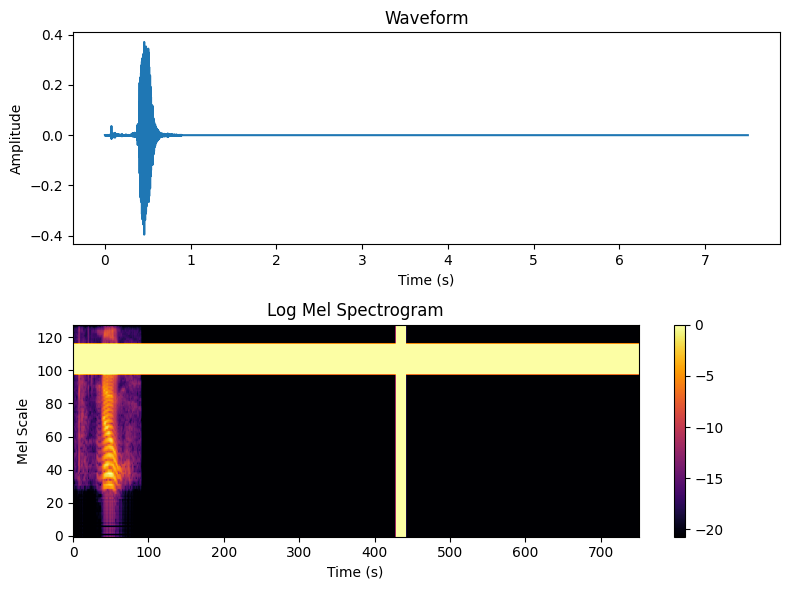

rubout|m|d|m|t|g|nine|six|seven|oh
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


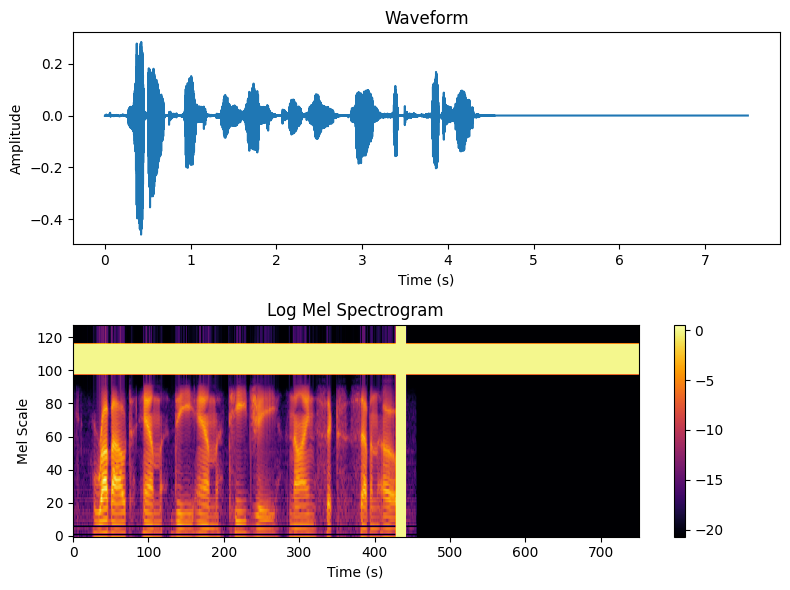

no
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


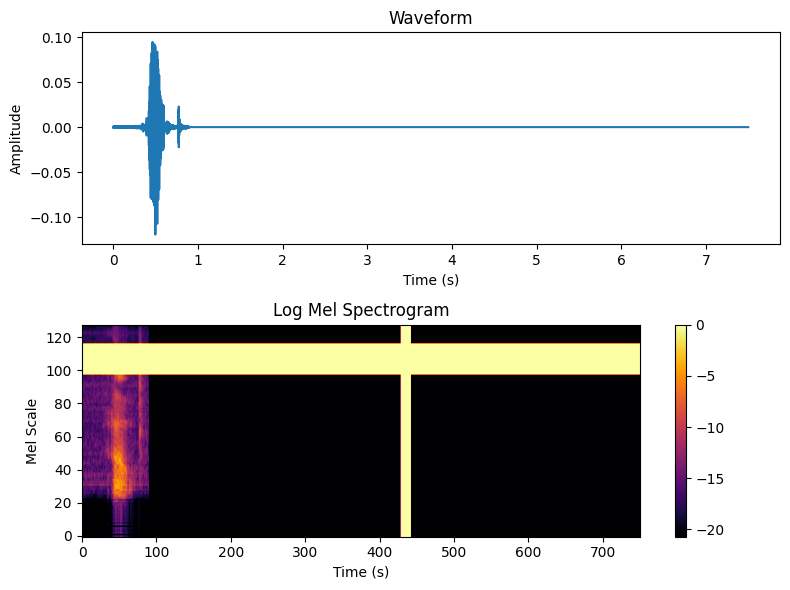

b|r|o|a|d|h|e|a|d|r|o|a|d
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


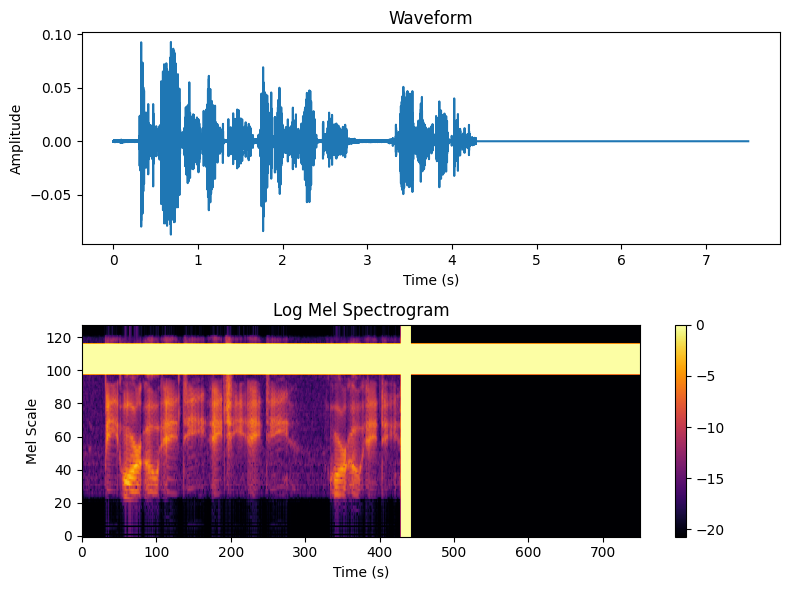

g|i|b|s|o|n|i|a
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


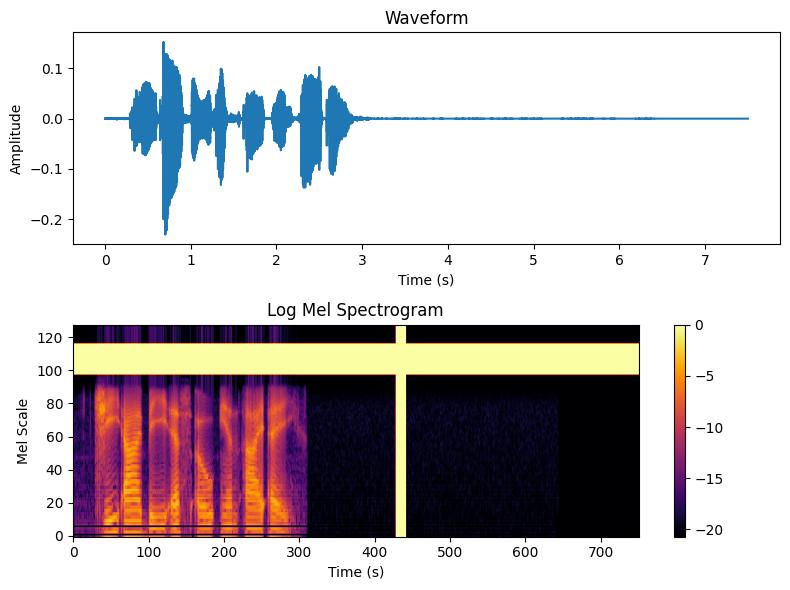

j|v|p|e|eight|seven|zero
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


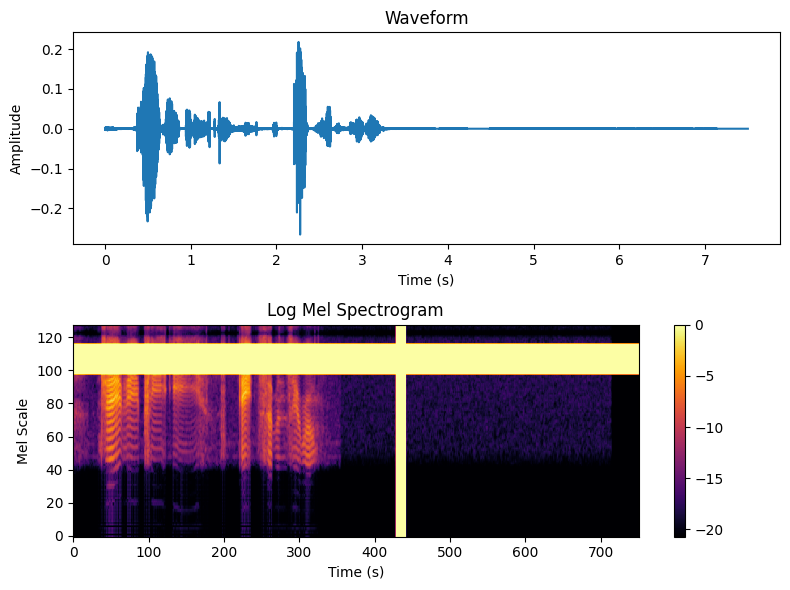

p|i|t|t|s|b|u|r|g|h
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


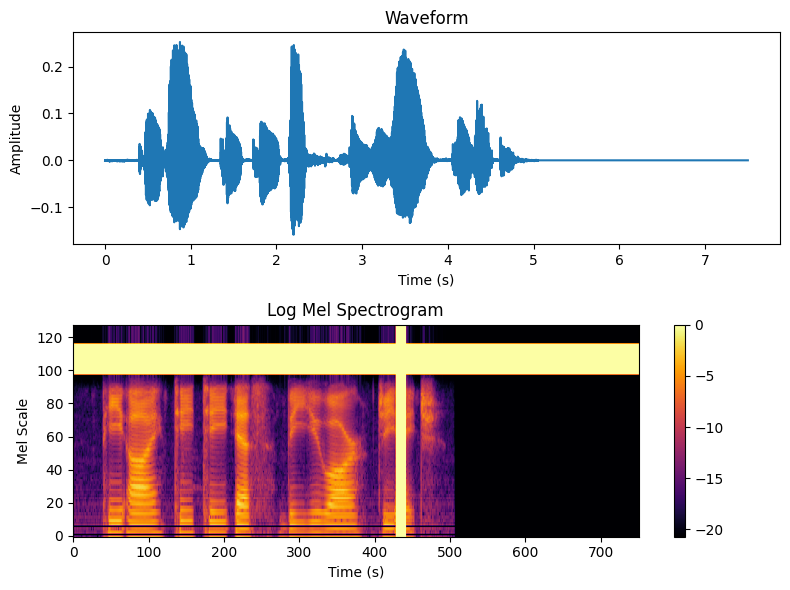

enter|one|thirty|one
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


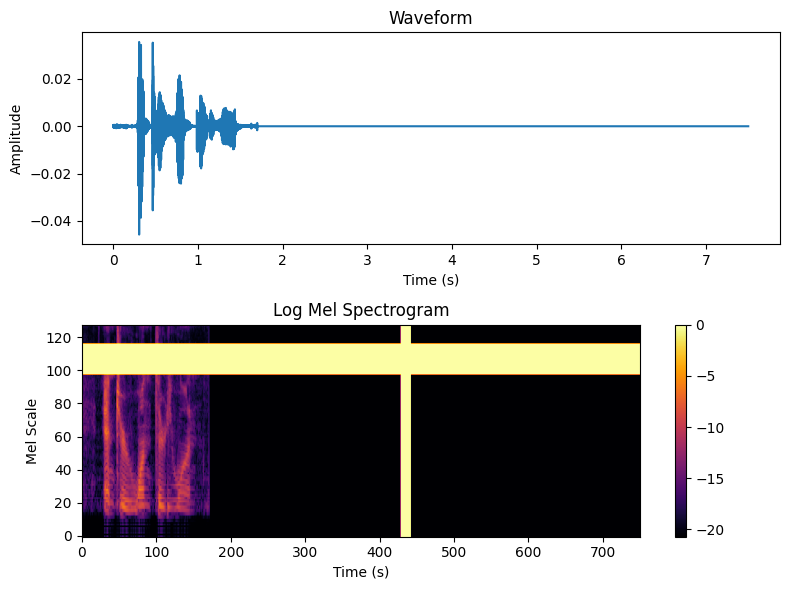

a|r|a|p|a|h|o|e
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


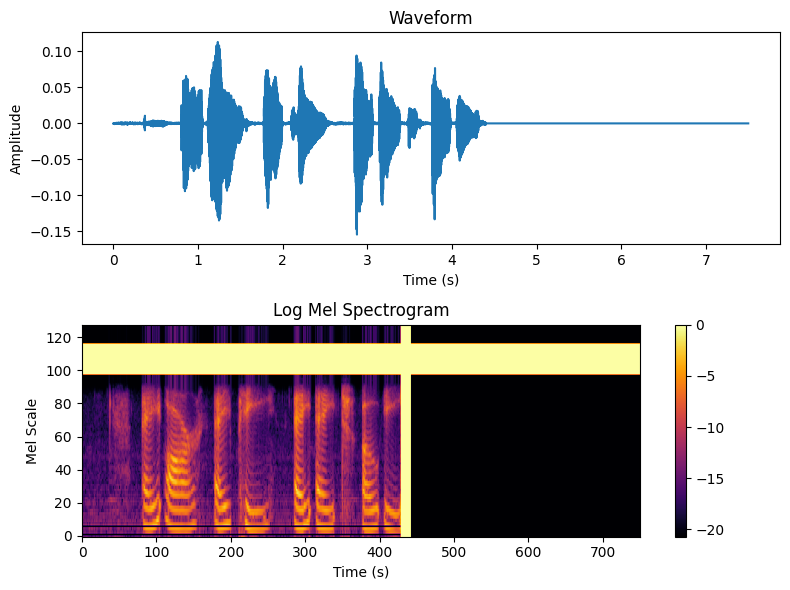

five ten, five ten
n e w y o r k, h w y o rs 
one seven forty seven, one seven forty seven
rubout p o o b eight, rubout p o o b eight
r i c h a r d, r i c h a r d
one five two one seven, one five two one seven
erase i g n m forty three seventeen, erase i g n m forty three seventeen
l i n d a, l i n d a
w a r r e n, w a r r e n
r u s k i n, r u s k i n
t h a d, t h a d
erase c k c w fourteen eighty five, erase c k c w fourteen eighty five
v e c c h i, v e c c h i
t h a y e r, t h a y e r
four twenty eight seventy one, four twenty eight seventy one
two seven one zero eight two six, two seven one zero eight two six
rubout t b p b six, rubout t b p b six
t r e n t o n, t r e n t o n
a r a p a h o e, a r a p a h o e
help, help
m c k e e s p o r t, m k j ee s b o r d
two nine six six two, two  nine six six two
g l e n n, g l e n n
s u m m e r l e a, s u m m e r l e a
v a n d e r l a a n, v a n d e r l a a n
stop, stop
c i n d y, c i n d y
seven seventeen fifty seven, seven seventeen fifty se

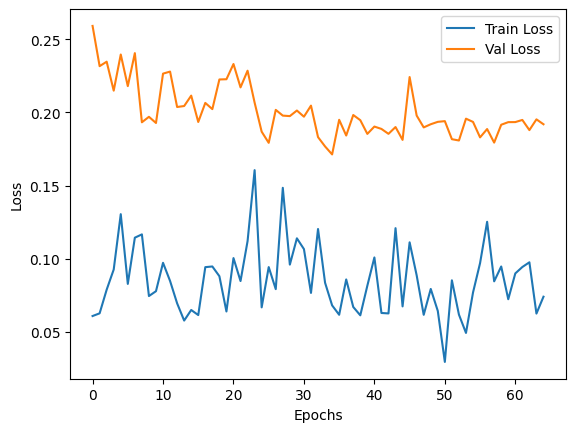

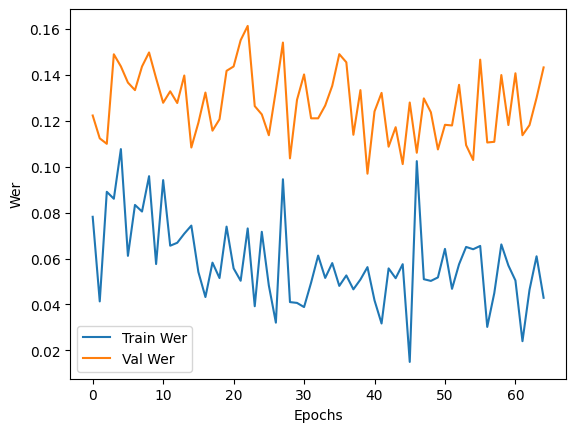

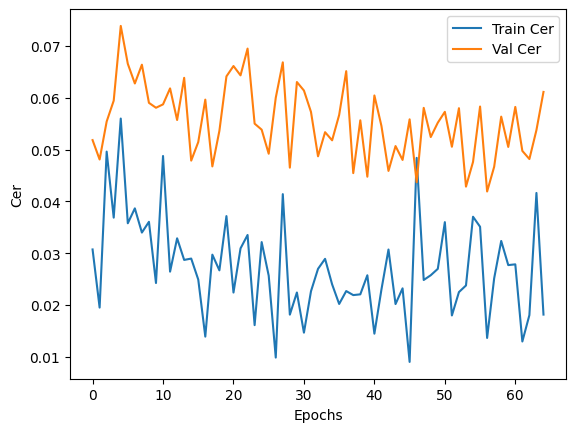

l e x i n g t o n, l e x i n e two n
erase c q q f seven, erase c q q f seven
one five two two seven, one five two two seven
one five two three two, one five two three two
r h n g a fifty four eighty three, r h n g a fifty fourigty three
w i l l e t t, w i l l e t t
enter eight thirteen, enter eight tir twon
rubout g m e f three nine, rubout g m e f three ne
p i t t s b u r g h, p i t t s b u r g h
v a n e s s a, v a n e s s a
enter seven, enter seven
x k i t b two six one one, xs k i t b two six one one
j p e g four, j p e g fourr
m o r e w o o d, m o r e w o o d
enter twenty one, enter twenty one
may second nineteen sixty five, may sectnd nineteen sixty five
eleven twenty seven fifty seven, eneven twenty seven fifty seven
w y a t u seventy seven seventy seven, w y a t u seventy seven seventy seven
october twenty four nineteen seventy, fine tober twenty four ninethre seventy
p i t t s b u r g h, p i t t s b u r g h
rubout n i m n one, rubout n i m n one
m c k e e s r o c k s, m c k e 

In [ ]:
#exp6
freq_mask_param = 30
time_mask_param = 30
train_data_transform = tranform_final
transform_fft = nn.Sequential(
    torchaudio.transforms.FrequencyMasking(freq_mask_param=freq_mask_param),
    torchaudio.transforms.TimeMasking(time_mask_param=time_mask_param)
)
model = ctc_experamint(hparams=hparams, transform_fft=transform_fft, train_data_transform=train_data_transform, load_model_path=path)

In [ ]:
name = 'comb_aug_model_weights_2.pt'
path = '/content/drive/MyDrive/audio_speech_model_weights' +'/' + name

torch.save(model.state_dict(), path)

## evaluation


In [ ]:
train_loss_history, train_wer_history, train_cer_history = train_stats
val_loss_history, val_wer_history, val_cer_history = val_stats
plot_train_val(train_loss_history, val_loss_history)
plot_train_val(train_wer_history, val_wer_history, "Wer")
plot_train_val(train_cer_history, val_cer_history, "Cer")

In [ ]:
from torchaudio.models.decoder import ctc_decoder

class Beam_search_dec():
    def __init__(self, blank=0, lm=True):
      self.LM_WEIGHT = 0.2
      self.WORD_SCORE = -0.0005
      self.beam_size = 50
      self.nbest = 1
      self.lex = None
      self.tokens = librispeech_files.tokens
      self.lm = None
      if lm:
        self.lex = librispeech_files.lexicon
        self.lm = librispeech_files.lm

      self.beam_search_decoder = ctc_decoder(
            lexicon=self.lex,
            tokens=self.tokens,
            lm=self.lm,
            nbest=self.nbest,
            beam_size=self.beam_size,
            lm_weight=self.LM_WEIGHT,
            word_score=self.WORD_SCORE,
)
      self.blank = blank

    def decode(self, emmision):
      emmision = emmision.cpu()
      emmision = torch.unsqueeze(emmision, 0)
      probabilities = F.softmax(emmision, dim=2)
      beam_search_result = self.beam_search_decoder(probabilities)


      tokens = beam_search_result[0][0].tokens.tolist()
      beam_search_transcript = ''.join(tokenizer.int_to_char[token] for token in tokens).strip()
      # else:
      #   beam_search_transcript = " ".join(beam_search_result[0][0].words).strip()

      return beam_search_transcript


In [ ]:
b_s_decoder = Beam_search_dec(lm=True)

In [ ]:
mel_spec.to(device)
#b_s_decoder.decode
wer, cer = wer_valedation(test_data_loader, model=model, verbus=True, ext_decoder=b_s_decoder.decode, full_epoch=True)
print(f'WER: {wer}')
print(f'CER: {cer}')


seven one six two four four six seven one four,  seven one six two four four six seven one four  
erase p q y v t five ninety eight,  erase p q y b d five ninety eight  
w o o d,  w o o d  
b r e n t w o o d,  b r e n t w o o d  
six five five eight seven four zero,  six five five eight seven four zero  
r h n g a fifty four eighty three,  r h n g a fifty four eighty three  
sixty six thirty three,  sixty six thirty three  
s a n d l e r,  s a n d l e r  
nineteen,  nine ten  
p a t t e r s o n,  p a t t e r s o n  
six eight three three oh seven five,  six eight three three oh seven five  
erase e d z e fifty six,  erase e   e fifty six  
two two six,  two two six  
enter four five eight two one,  enter four five eight two one  
one five two one seven,  one five two one seven  
no,  no  
enter five six eight,  enter five six eight  
m a r g a r e t m o r r i s o n,  m a r g a r e t m o r r i s o n  
six eight three six zero two seven,  six eight three six zero two seven  
one five two

In [ ]:
name = 'model_weights.pt'
path = '/content/drive/MyDrive/audio_speech_model_weights' +'/' + name

torch.save(model.state_dict(), path)

# Encoder Decoder end2end


In [ ]:
import math
class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 100):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x):
        """
        Arguments:
            x: Tensor, shape ``[seq_len, batch_size, embedding_dim]``
        """
        x = x + self.pe[:x.size(0)]
        return self.dropout(x)

In [ ]:
class Decoder_Attention_LSTM(nn.Module):
    def __init__(self, embed_size, vocab, encoder_dim, decoder_dim, p_dropout=0.2, num_att_heads=2, num_lstm_layers=1):
        super().__init__()

        self.vocab = vocab
        self.vocab_size = vocab.num_tokens
        self.decoder_dim = decoder_dim
        self.NUM_att_HEADS = num_att_heads
        self.LSTM_NUM_LAYERS = num_lstm_layers
        self.p_dropout = p_dropout

        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.embedding = nn.Embedding(self.vocab_size, embed_size)
        self.h_to_query = nn.Linear(decoder_dim, encoder_dim)
        self.attention = nn.MultiheadAttention(encoder_dim, self.NUM_att_HEADS, batch_first=False)
        self.lstm = nn.LSTM(embed_size+encoder_dim, decoder_dim, bias=True, batch_first=False, num_layers = self.LSTM_NUM_LAYERS, dropout=self.p_dropout)
        self.drop = nn.Dropout(self.p_dropout)
        self.fc = nn.Linear(decoder_dim, decoder_dim//2)
        self.fc2 = nn.Linear(decoder_dim//2, self.vocab_size)


    def forward(self, captions, features):
        self.train()
        embeds = self.embedding(captions)
        #first hidden state
        h, c = self.init_hidden_state(features)

        seq_len = len(captions[0])-1

        features = features.permute(1, 0, 2)
        predictions = torch.zeros(captions.size(0), seq_len, self.vocab_size).to(device)

        for word in range(seq_len):
            #attention
            q = self.h_to_query(h)

            context, _ = self.attention(q, features, features)

            if self.LSTM_NUM_LAYERS > 1:
            #lstm
              L, B, E = context.squeeze(0).size()
              summed_tensor = torch.sum(context.squeeze(0), dim=0)
            else:
              summed_tensor = context.squeeze(0)

            input = torch.cat((embeds[:, word], summed_tensor), dim=1).unsqueeze(0)
            h_out , (h, c) = self.lstm(input, (h, c))
            #output
            out = self.fc(self.drop(h_out.squeeze(0)))
            out = self.fc2(F.relu(out))
            predictions[:,word] = out

        predictions = F.log_softmax(predictions, dim=2)


        return predictions

    def predict_next_word(self, current_hidden_state, word, features):
           # print(f"word: {word}")
            word_idx = torch.tensor([word]).view(1,-1).to(torch.int).to(device)
            embeds = self.embedding(word_idx)

            # attention
            h = current_hidden_state[0]
            q = self.h_to_query(h)

            context, _ = self.attention(q, features, features)

            #lstm
            if self.LSTM_NUM_LAYERS > 1:
              L, B, E = context.squeeze(0).size()
              summed_tensor = torch.sum(context.squeeze(0), dim=0)
            else:
              summed_tensor = context.squeeze(0)

            input = torch.cat((embeds[:, 0], summed_tensor), dim=1).unsqueeze(0)
            h_out , (h, c) = self.lstm(input, current_hidden_state)
            next_hidden_state = (h, c)

            # output predicted word
            out = self.fc(self.drop(h_out.squeeze(0)))
            out = self.fc2(F.relu(out))
            out = out.view(features.size(1),-1)
            prediction_idx = out.argmax(dim=1)

            return prediction_idx.item(), next_hidden_state


    def generate_caption(self, features, max_len):
        self.eval()
        start_word = self.vocab.char_to_int[tokenizer.start_token]
        h, c = self.init_hidden_state(features)
        features = features.permute(1, 0, 2)
        captions = []
        current_word = start_word

        for word in range(max_len):

            #predict next word
            pred_word, (h,c) = self.predict_next_word((h, c), current_word, features)
            #break when <>
            if pred_word == self.vocab.char_to_int[tokenizer.end_token]:
                break
            #next word + append predicted word to total caption
            captions.append(pred_word)
            current_word = pred_word

        return captions


    def init_hidden_state(self, features):
        mean_features = features.mean(dim=1)
        h = self.init_h(mean_features)
        c = self.init_c(mean_features)
        (h, c) = h.unsqueeze(0).repeat(self.LSTM_NUM_LAYERS, 1, 1), c.unsqueeze(0).repeat(self.LSTM_NUM_LAYERS, 1, 1)
        return h, c

In [ ]:
import torchvision.models as models
class Encoder(nn.Module):
    def __init__(self, encoder_dim):
        super(Encoder, self).__init__()
        self.posembs = PositionalEncoding(encoder_dim)
        self.conv1 = nn.Conv2d(1,3, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(256,128,kernel_size=1)
        self.fc = nn.Linear(128*8, encoder_dim)
        resnet = models.resnet18(pretrained=False)
        for param in resnet.parameters():
             param.requires_grad_(True)

        res_modules = list(resnet.children())[:-3]
        self.resnet = nn.Sequential(*res_modules)


    def forward(self, waveform):

        features = self.conv1(waveform)
        features = self.resnet(features)
        features = self.conv2(F.relu(features))
        features = features.permute(0, 3, 2, 1)
        features = features.reshape(features.size(0), features.size(1), -1)
        features = self.fc(F.relu(features))
        features = self.posembs(features)
        return features

In [ ]:
class Encoder3(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.mel_spec = mel_spectrogram.to(device)
        self.posembs = PositionalEncoding(encoder_dim)

    def forward(self, waveform):

        # Convert waveform to Mel scale
        mel_output = self.mel_spec(waveform)
        # Convert to log scale (add a small value to avoid log(0))
        log_mel_output = torch.log(mel_output + 1e-9)
        log_mel_output = log_mel_output.permute(0, 1, 3, 2)
        features = log_mel_output.view(log_mel_output.size(0), -1, log_mel_output.size(-1))
        featurs = self.posembs(features)

        return features

In [ ]:
class s2t_model(nn.Module):
    def __init__(self, embed_size, vocab, encoder_dim, decoder_dim, p_dropout=0.2,num_att_heads=2, num_lstm_layers=1):
        super().__init__()
        self.vocab = vocab
        self.encoder = Encoder(encoder_dim)
        self.decoder = Decoder_Attention_LSTM(embed_size=embed_size, vocab = vocab, encoder_dim=encoder_dim, decoder_dim=decoder_dim, p_dropout=0.2, num_att_heads=num_att_heads, num_lstm_layers=num_lstm_layers)
        #self.mel_spec = mel_spectrogram.to(device)
    def forward(self, text, audio):
        features = self.encoder(audio)
        out = self.decoder(text, features)

        return out

    def generate_text(self, audio, max_len=100):
      features = model.encoder(audio.to(device))

      text = self.decoder.generate_caption(features, max_len)
      pred_text = tokenizer.detokenize(text)

      return pred_text

In [ ]:
# define the tokenizer
tokenizer = LetterTokenizer(add_start_stop=True)

with open(librispeech_files.tokens, 'r') as file:
    content = file.read()

tokens = content.replace('\n',"")
print(tokens)
tokenizer.fit(tokens)


tokens = [tokenizer.tokenize(text) for text in [tokens]]
print("Tokens:", tokens)

padded_tokens = tokenizer.pad_sequences(tokens)
print("Padded Tokens:", padded_tokens)

for pt in padded_tokens:
    print(tokenizer.detokenize(pt))  # This will show start, end, and padding tokens

-|etaonihsrdlumwcfgypbvk'xjqz
Tokens: [[29, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30]]
Padded Tokens: [[29, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30]]
-|etaonihsrdlumwcfgypbvk'xjqz


In [ ]:
# creating dataloaders
batch_size = 64
transform = tranform_final  # Add your audio transformations

train_data_loader, val_data_loader, test_data_loader = create_data_loaders(batch_size=batch_size, transform=transform)

torch.Size([64, 1, 120000])
enter|nine|eight|nine
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


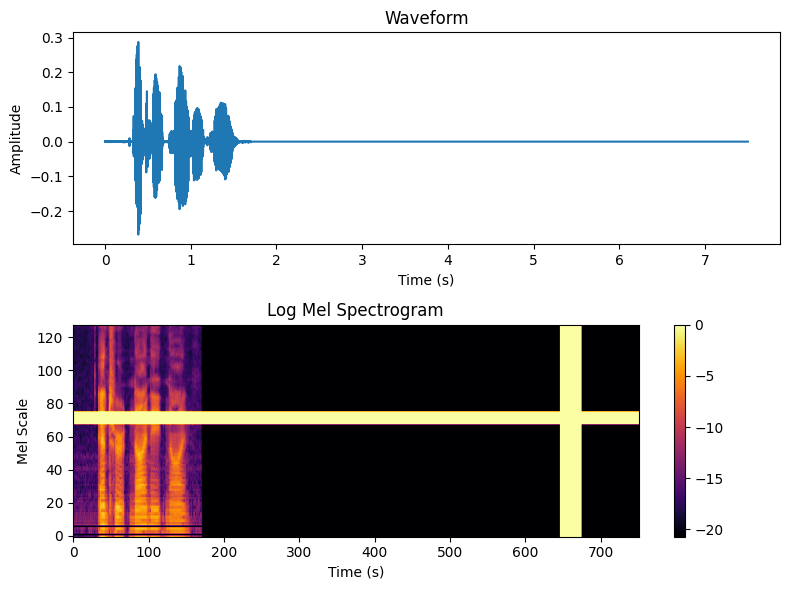

enter|thirty|seven
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


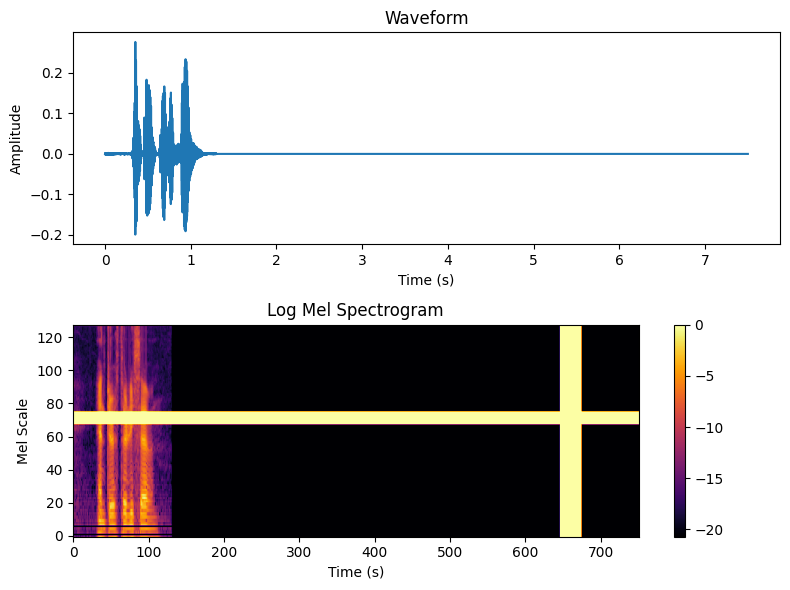

stop
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


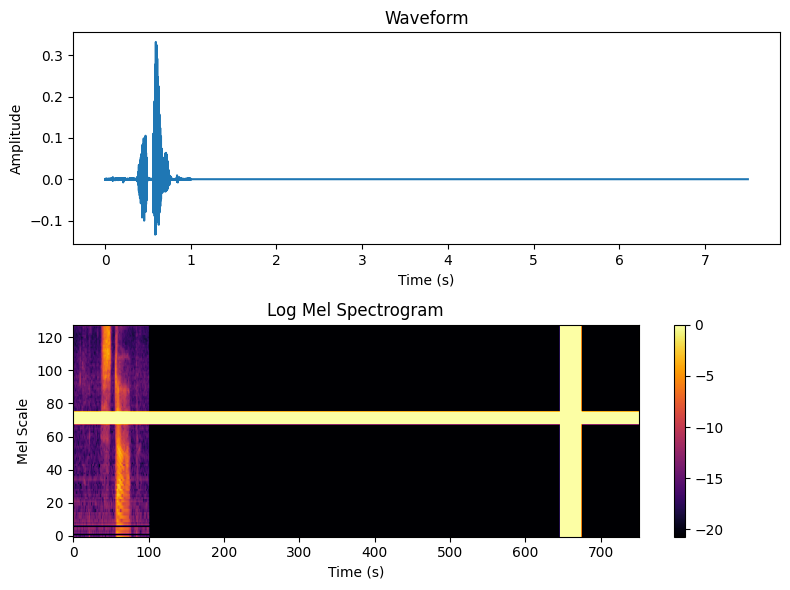

repeat
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


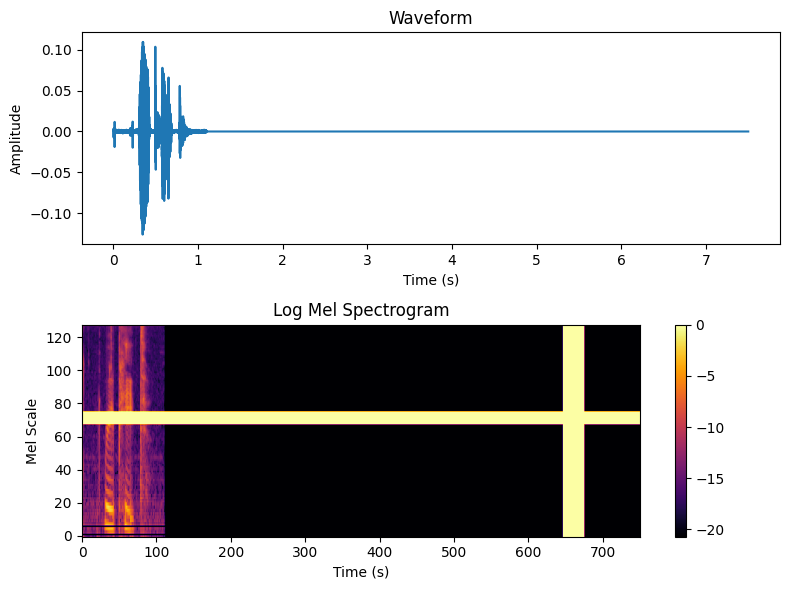

s|t|e|v|e|n
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


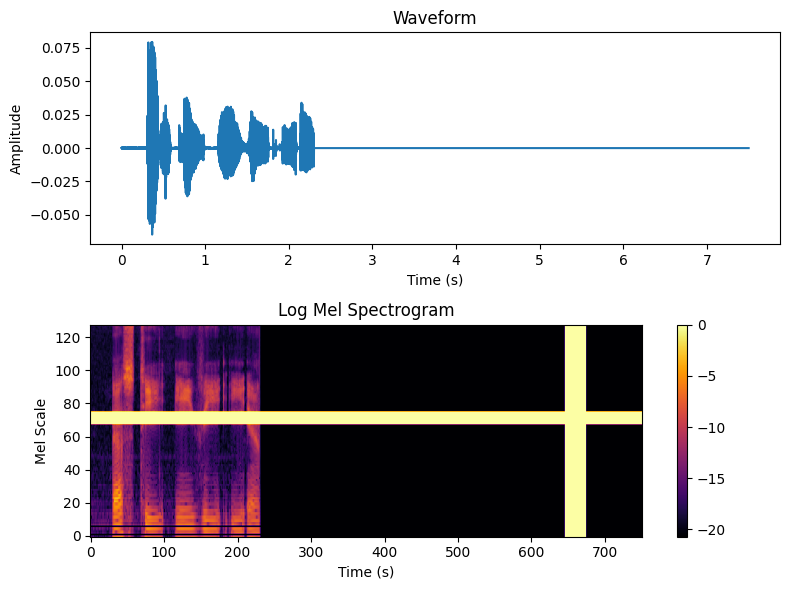

erase|w|e|s|f|twenty|four|oh|three
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


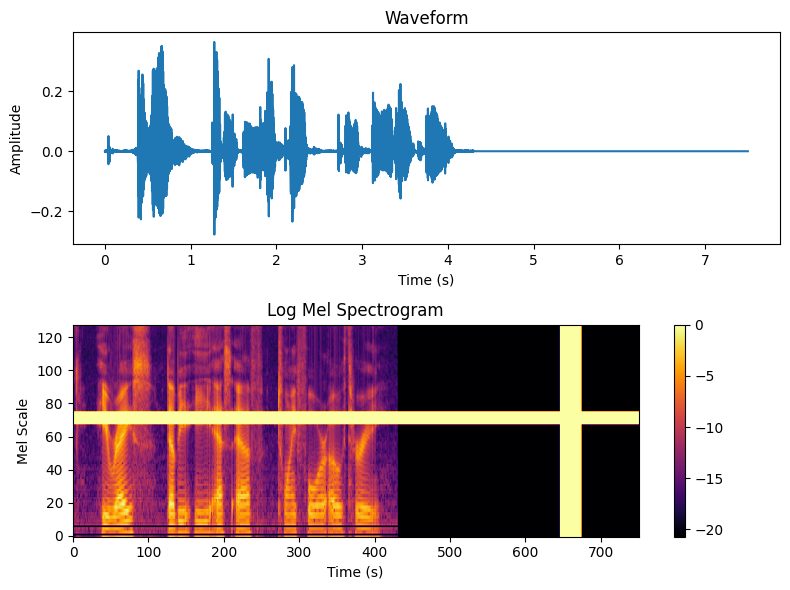

l|e|w|i|s
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


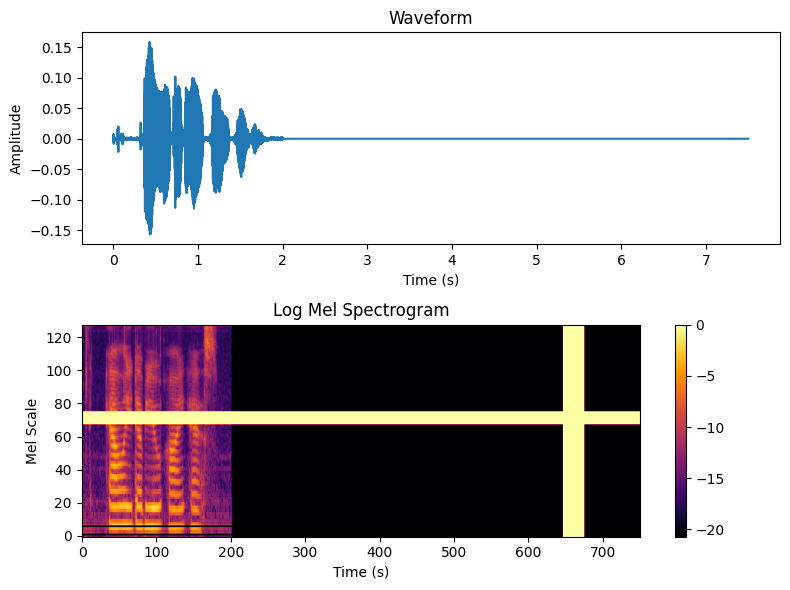

no
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


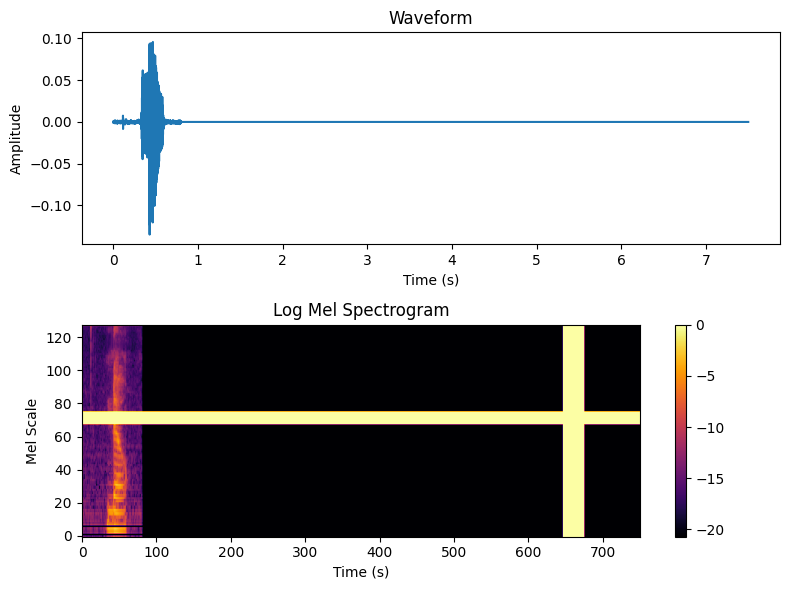

nine|two|two|seven|two|two|zero
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


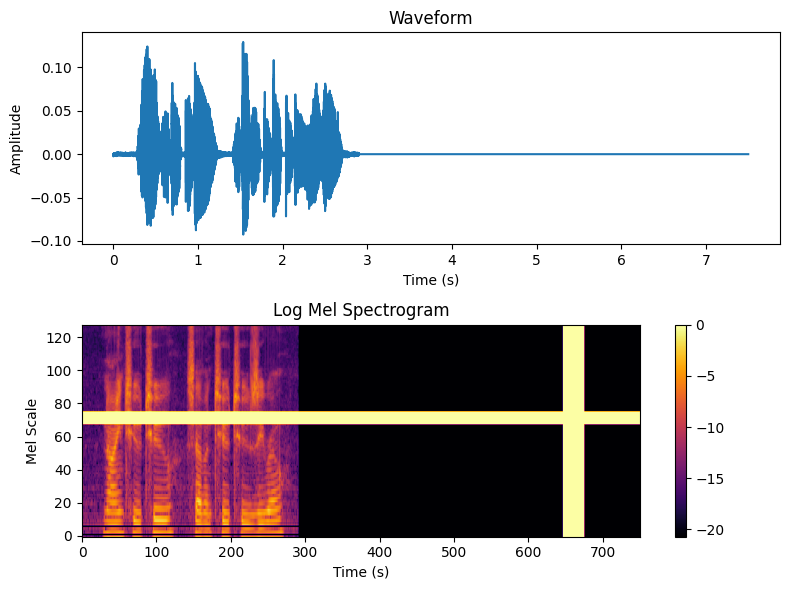

help
Log_mel size:torch.Size([64, 1, 128, 751])
transform size:torch.Size([64, 1, 128, 751])


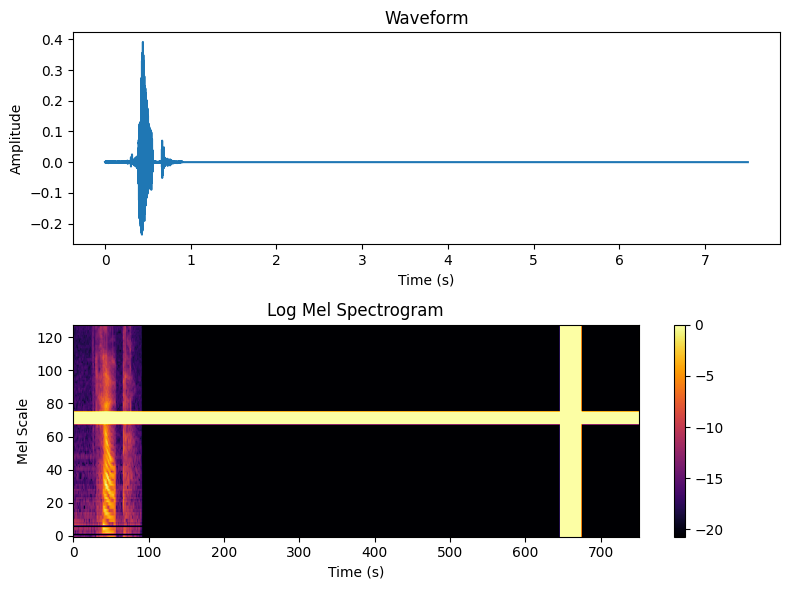

[[29, 2, 6, 3, 2, 10, 1, 17, 7, 17, 3, 19, 1, 9, 7, 25, 3, 19, 1, 3, 8, 10, 2, 2, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31], [29, 20, 1, 3, 1, 23, 1, 25, 1, 28, 2, 10, 5, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31], [29, 21, 1, 10, 1, 2, 1, 6, 1, 6, 1, 4, 1, 6, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31], [29, 26, 1, 5, 1, 6, 1, 4, 1, 3, 1, 8, 1, 4, 1, 6, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31], [29, 20, 1, 7, 1, 3, 1, 3, 1, 9, 1, 21, 1, 13, 1, 10, 1, 18, 1, 8, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31], [29, 9, 7, 25, 1, 9, 7, 25, 1, 5, 6, 2, 1, 17, 7, 22, 2, 1, 28, 2, 10, 5, 1, 9, 7, 25, 1, 17, 5, 13, 10, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31], [29, 26, 1, 5, 1, 8, 1, 6, 1, 9, 1, 5, 1, 6, 30, 31, 31, 31, 

In [ ]:
mel_spec.to('cpu')
plot_data(train_data_loader)
for batch in train_data_loader:
  waveforms, captions, sample_rate = batch
  print(captions)
  break


In [ ]:
def testing_ce_loss(data_loader, model=None, to_log_mel=False):
  # Testing
  model.eval()
  test_loss = 0.0
  with torch.no_grad():
      for i, batch in enumerate(data_loader):  # Assume test_loader is your DataLoader for test data
        waveforms, captions, sample_rate = batch
        waveforms = to_mel(waveforms.to(device), to_log_mel=to_log_mel)
        #waveforms = torch.zeros_like(waveforms).to(device)
        captions = torch.tensor(captions).to(device)

        pred = model(captions, waveforms).permute(0,2,1)
        captions = captions[:,1:]

        # Loss calc
        loss = criterion(pred,captions)

        test_loss += loss.item() * batch_size

      test_loss /= len(data_loader.dataset)

  return test_loss


In [ ]:
embed_size= 512
vocab_size = tokenizer.num_tokens
encoder_dim= 256
decoder_dim= 512
lr = 0.0005
weight_decay = 1e-5
p_dropout = 0.1
fft_trans = transform_fft
to_log_mel = True

torch.cuda.empty_cache()
model = s2t_model(
    embed_size=embed_size,
    vocab = tokenizer,
    encoder_dim=encoder_dim,
    decoder_dim=decoder_dim,
    p_dropout = p_dropout,
    num_att_heads=2,
    num_lstm_layers=1
).to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

padding_idx = tokenizer.char_to_int[tokenizer.pad_token]
criterion = nn.CrossEntropyLoss(ignore_index = padding_idx)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:71: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


In [ ]:

def mod_captions(original_tensor, threshold=0.5):
  # Generate a random mask with the same shape as the tensor
  random_mask = torch.rand_like(original_tensor, dtype=torch.float32) < threshold

  # Use the random mask to zero out elements in the original tensor
  modified_tensor = original_tensor * random_mask

  return modified_tensor


In [ ]:
mod_captions(torch.tensor([[1,2,3,4],[1,2,3,4],[1,2,3,4]]))

tensor([[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]])

In [ ]:
num_epochs = 400
train_loss_history = []
train_wer_history = []
train_cer_history = []
val_loss_history = []
val_wer_history = []
val_cer_history = []
mel_spec.to(device)


for epoch in range(1,num_epochs+1):
    model.train()
    running_loss = 0.0
    running_acc = 0.0
    total_num_words = 0

    for i, batch in enumerate(train_data_loader):
        waveforms, captions, sample_rate = batch
        waveforms = waveforms.to(device)
        waveforms = to_mel(waveforms, to_log_mel=to_log_mel)
        waveforms = transform_fft(waveforms)
        #waveforms = torch.zeros_like(waveforms).to(device)

        captions = torch.tensor(captions).to(device)
        input = mod_captions(captions, 0.35)


        pred = model(input, waveforms).permute(0,2,1)
        captions = captions[:,1:]

        # Loss calc
        targets = captions[:,1:].reshape(-1)
        loss = criterion(pred,captions)
        #backward + optimitzer step + zero grads
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        running_loss += loss.item()*batch_size

    if epoch % 10 == 0:
      train_wer, train_cer = wer_valedation(train_data_loader, model=model, verbus=True, transform_fft=transform_fft, to_log_mel=to_log_mel)
      val_wer, val_cer = wer_valedation(val_data_loader, model=model, to_log_mel=to_log_mel)
      val_loss = testing_ce_loss(val_data_loader, model, to_log_mel=to_log_mel)
      train_loss = running_loss / len(train_data_loader.dataset)
      print('Epoch: {} | lr: {} | Train Loss: {:.4f}  |  Val Loss: {:.4f}  |  Train Wer: {:.4f} |  Val Wer: {:.4f} '.format(epoch, lr, train_loss, val_loss, train_wer, val_wer))
      train_loss_history.append(train_loss)
      train_wer_history.append(train_wer)
      train_cer_history.append(train_cer)
      val_loss_history.append(val_loss)
      val_wer_history.append(val_wer)
      val_cer_history.append(val_cer)



six six one five zero six four, rubout five two one six eight seven five two one
b e e l e r, rubout n b u r b u r d w
five one nine, six eight four one seven four one
august twenty second nineteen sixty nine, rubout t e t s b u r g hundred and eighty seven
rubout v e w z seven seventy two, rubout t e t s b u r d a d eighty seventy three
fifty eight oh nine and a half, rubout r b u r g h
e r i k, rubout r b u r d
five t h a v e n u e, p i t t t s b u r g h
b r o s t, erase t t s b u r g h
seven seventeen fifty seven, six eight four seven four seven
go, enter six eight five
n e i l, r b u r l e l d
repeat, erase twenty seven
enter sixty one, erase twenty five
one five one four seven, five two one two one six eight
s c a v i n c k y, rubout r b u r g h a d a d
d a v i d, rubout n b u r e n
repeat, enter seventy five
d a l z e l l, rubout n b u r d a d
one eleven, two one five two one
u s i q n seventy one, rubout r e t s b u r d r d
stop, enter sixty nine
enter seven thirty eight, enter 

KeyboardInterrupt: ignored

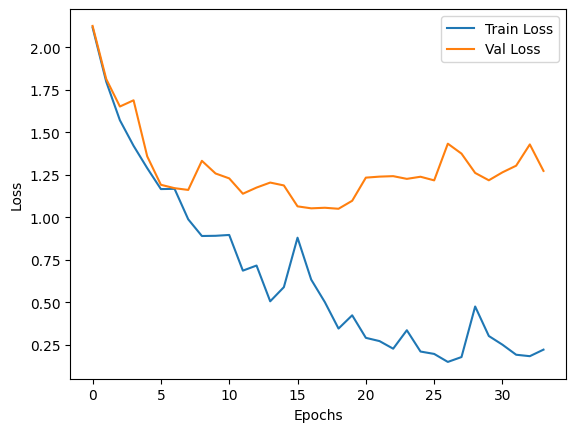

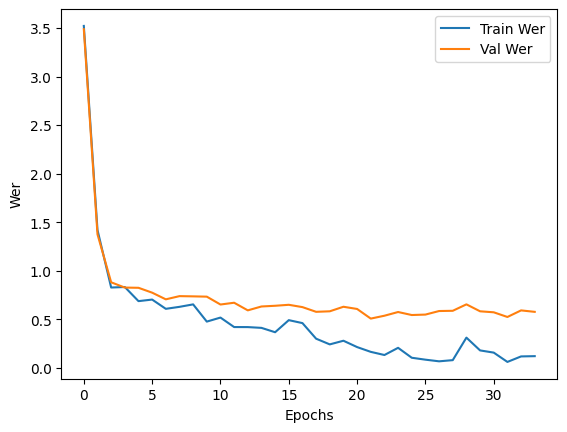

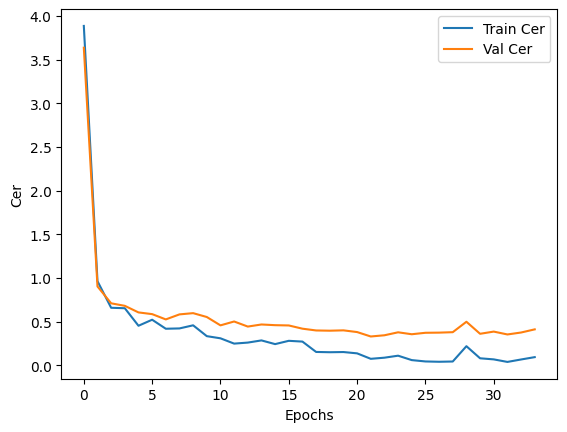

m c k e e s r o c k s, e a n e p n p s s
enter eight, enter eight
ten twenty seven sixty two, two seven seven sixty seven
enter five six eight, enter five sixty
erase f o x k eight, erase s v i f t t
no, no
enter four five eight two one, enter five two two two one
enter two nine eight one, enter two nine eighty one
enter eight thirteen, enter fifteen fifty
m y e r s, l e n s k
twelve twenty nine fifty nine, twelve thirty oh nine eighty nine
no, no
w o o d, e e w o o n
s y f c d nine six oh one seven, s f y g l six oh seven one seven
rubout n i m n one, rubout w a n p four
c i n d y, e l e w l y
fifty two nineteen, fifty three eight
three zero two one, three two two one
h o u s e r, h h u l e n
w i l l e t t, m a m l i t two eight
g f t u one three three two, t l f h o thirty three
eight eight four three six four eight, e z r four eight four six four
oh two one seven three, enter two one eight
g i n s b e r g, b i s k i n t
yes, yes
erase a b f n q fifty seven, erase a x x k x fifty sev

In [ ]:
# Eval
plot_train_val(train_loss_history, val_loss_history)
plot_train_val(train_wer_history, val_wer_history, "Wer")
plot_train_val(train_cer_history, val_cer_history, "Cer")
verbus=True
for i, data_loader in enumerate([test_data_loader, val_data_loader, train_data_loader]):
  if i > 0:
    verbus=False
  wer, cer = wer_valedation(data_loader, model=model, verbus=verbus, ext_decoder= None, full_epoch=True, to_log_mel=to_log_mel)
  print(f'WER: {wer}')
  print(f'CER: {cer}')


#

# Final Model showcase

In [ ]:
hparams = {
    "n_cnn_layers": 4,
    "n_rnn_layers": 3,
    "rnn_dim": 512,
    "n_class": tokenizer.num_tokens - 3,
    "n_feats": 128,
    "stride": 2,
    "dropout": 0.1,
    "learning_rate": 0.0005,
    "batch_size": 64,
    "epochs": 250
}

print(tokenizer.add_start_stop)

False


In [ ]:
load_model = True

model = SpeechRecognitionModel(
    hparams['n_cnn_layers'], hparams['n_rnn_layers'], hparams['rnn_dim'],
    hparams['n_class'], hparams['n_feats'], hparams['stride'], hparams['dropout']
    ).to(device)

if load_model:
  name = 'comb_aug_model_weights_2.pt'
  path = '/content/drive/MyDrive/audio_speech_model_weights' +'/' + name
  model.load_state_dict(torch.load(path))

In [ ]:
mel_spec.to(device)
#b_s_decoder.decode
b_s_decoder = Beam_search_dec(lm=True)
wer, cer = wer_valedation(test_data_loader, model=model, verbus=True, ext_decoder= b_s_decoder.decode, full_epoch=True)
print(f'WER: {wer}')
print(f'CER: {cer}')

a seven,  a seven  
eleven twenty seven fifty seven,  eleven twenty seven fifty seven  
one four six one eight,  one four six one eight  
enter thirty,  enter thirty  
rubout v z j h p seven thirty six,  rub out   j h p seven thirty six  
k a u f m a n,  k a u s m a n  
no,  no  
m a r g a r e t m o r r i s o n,  m a r g a r e t m o r r i s o n  
yes,  yes  
enter eight thirteen,  enter eight thirty  
j a n e t,  j a n e  
five twenty seven sixty six,   five twenty seven sixty six  
c e d a r v i l l e,  c e v a r v i l l e  
erase k m h n i six oh five,  erase k m h n i six oh five  
oh two one seven three,  five two one seven three  
one five two one three,  one five two one three  
l k k n thirty eight,  l k k n thirty eight  
d a j n h ninety six,  b a j n h ninety six  
may second nineteen sixty five,  may second nineteen sixty five  
enter seven,  enter seven  
erase c q q f seven,  erase c q q f seven  
one three seven,  one three seven  
seven one six two four four six seven on

In [ ]:
mel_spec.to(device)
model.eval()
pred_texts = []
target_texts = []
ext_decoder = b_s_decoder.decode
num_of_examples = 10

with torch.no_grad():
  for j, batch in enumerate(test_data_loader):
      waveforms, captions, sample_rate = batch
      waveforms = waveforms.to(device)
      for i,_ in enumerate(waveforms):
        audio = waveforms[i]
        mel_features = to_mel(audio.view(1,1,-1))
        gen_text = model.generate_text(mel_features, ext_decoder=ext_decoder)
        audio = audio.to('cpu').squeeze(0,1)
        play_audio(audio, sample_rate[0])
        gen_text = gen_text.replace('|', ' ')
        target_text = tokenizer.detokenize(captions[i]).replace('|', ' ')
        pred_texts.append(gen_text)
        target_texts.append(target_text)
        print(f"Predicted Text:{gen_text}")
        print(f"Target Text:{target_text}")
        if i > num_of_examples:
          break

      break



Predicted Text: two forty  
Target Text:two forty


Predicted Text: m a r g a r e t m o r r i s o n  
Target Text:m a r g a r e t m o r r i s o n


Predicted Text: six eight three three oh seven five  
Target Text:six eight three three oh seven five


Predicted Text: twelve thirty three  
Target Text:twelve thirty three


Predicted Text: nine ten  
Target Text:nineteen


Predicted Text: yes  
Target Text:yes


Predicted Text: p i t t s b u r g h  
Target Text:p i t t s b u r g h


Predicted Text: january seventh nineteen sixty seven  
Target Text:january seventh nineteen sixty seven


Predicted Text: erase p q y b d five ninety eight  
Target Text:erase p q y v t five ninety eight


Predicted Text: s p e e r  
Target Text:s p e e r


Predicted Text: w y a t u seventy seven seventy seven  
Target Text:w y a t u seventy seven seventy seven


Predicted Text: enter eight thirty  
Target Text:enter eight thirteen
